In [1]:
import os
import subprocess
# os.environ["HDXER_PATH"] = "/home/alexi/Documents/HDXer"
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import glob
import pandas as pd

# VDX_dir = '/home/alexi/Documents/ValDX'

VDX_dir = "/home/alexi/Documents/ValDX/"

import sys
sys.path.append(VDX_dir)

from ValDX.VDX_dataclasses import merge_AnalysisData_classes

/home/alexi/Documents/interpretable-hdxer/notebooks/Figure-2.5_RW_Splits_Compare_Experiments


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/Bio/Application/__init__.py:40: BiopythonDeprecationWarning: The Bio.Application modules and modules relying on it have been deprecated.

Due to the on going maintenance burden of keeping command line application
wrappers up to date, we have decided to deprecate and eventually remove these
modules.

We instead now recommend building your command line and invoking it directly
with the subprocess module.
  warnings.warn(


In [2]:
def transform_naming(df):
    """
    Transform complex naming patterns in DataFrame to standardized ensemble categories.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame containing 'name' column with patterns like
                      'MBP_10Start_RW_bench_R3_k_sequence'
    
    Returns:
    pd.DataFrame: DataFrame with transformed naming columns
    """
    df = df.copy()
    
    # Extract method and fit from name
    df["protein"] = df["name"].apply(lambda x: x.split("_")[0])
    df["method"] = df["name"].apply(lambda x: x.split("_")[2])

    df["fit"] = df["name"].apply(lambda x: x.split("_")[3])
    

    # Initialize ensemble based on the core system type from name
    def determine_ensemble(name):
        parts = name.split("_")
        
        # Check for start conditions
        if "10Start" in name:
            return "10Start"
        if "1Start" in name:
            return "1Start"
            
        # Check for shaw_400
        if "shaw_400" in name:
            return "Shaw_400"
            
        # Check for TFES
        if "TFES" in name:
            return "TFES"
            
        # Check for clean/dirty
        if "clean" in name:
            return "af_clean"
        if "dirty" in name:
            return "af_dirty"
            
        # Default to method if no special case
        return parts[2]
    
    df["ensemble"] = df["name"].apply(determine_ensemble)
    
    df["split_type"] = df ["name"].apply(lambda x: x.split("_")[-3])
    df["replicate"] = df["calc_name"].apply(lambda x: x.split("_")[-1])  

    df["analysis"] = df["name"].apply(lambda x: x.split("_")[3])

    return df

In [3]:
results_dir ="/home/alexi/Documents/interpretable-hdxer/data/fig2.5/Benchmark_Ensembles_TFES"

results_dir = '/home/alexi/Documents/ValDX/results/Benchmark_Ensembles/'

# results_dir = "/home/alexi/Documents/ValDX/results/Find-Clusters2"
csvs = glob.glob(results_dir + '/**/*.csv', recursive=True)

# only include csvs that include MBP

csvs = [csv for csv in csvs if 'MBP' in csv]

print(len(csvs))


32


In [4]:
pkls = glob.glob(results_dir + '/**/*.pkl', recursive=True)


pkls = [pkl for pkl in pkls if 'MBP' in pkl]

print(len(pkls))

print(len(pkls))

from ValDX.VDX_dataclasses import merge_AnalysisData_classes

import pickle

# load all the pkls
pkl_list = []
for pkl in pkls:
    with open(pkl, 'rb') as f:
        pkl_list.append(pickle.load(f))


# merge all the pkls
pkl_list = merge_AnalysisData_classes(pkl_list)



32
32
Merging AnalysisData classes
['train_dfs', 'val_dfs', 'expt_df', 'merge_df', 'expt_segs', 'train_segs', 'val_segs', 'HDX_data', 'weights', 'features', 'BV_constants', 'LogPfs', 'analysis_df']


In [5]:
def extract_protein_name(pkl_list:dict, protein_names: list):
    """
    Extracts the protein name from the name in the dictionary of pandas dataframes
    """

    for key, df in pkl_list.items():
        # iterate through the rows
        for i, row in df.iterrows():
            # print(row["name"])
            # iterate through the protein names
            for protein_name in protein_names:
                # check if the protein name is in the row name
                if protein_name in row["name"]:
                    print(i, protein_name)
                    # if it is, set the protein name to the protein name
                    row["protein"] = protein_name
            df.loc[i] = row
        
        pkl_list[key] = df

                    
    return pkl_list

protein_names = ["MBP", "MBP", "BRD4", "LXRa", "MBP"]

pkl_list = extract_protein_name(pkl_list, protein_names)
        
pkl_list["analysis_df"]



0 MBP
0 MBP
0 MBP
1 MBP
1 MBP
1 MBP
2 MBP
2 MBP
2 MBP
3 MBP
3 MBP
3 MBP
4 MBP
4 MBP
4 MBP
5 MBP
5 MBP
5 MBP
6 MBP
6 MBP
6 MBP
7 MBP
7 MBP
7 MBP
8 MBP
8 MBP
8 MBP
9 MBP
9 MBP
9 MBP
10 MBP
10 MBP
10 MBP
11 MBP
11 MBP
11 MBP
12 MBP
12 MBP
12 MBP
13 MBP
13 MBP
13 MBP
14 MBP
14 MBP
14 MBP
15 MBP
15 MBP
15 MBP
16 MBP
16 MBP
16 MBP
17 MBP
17 MBP
17 MBP
18 MBP
18 MBP
18 MBP
19 MBP
19 MBP
19 MBP
20 MBP
20 MBP
20 MBP
21 MBP
21 MBP
21 MBP
22 MBP
22 MBP
22 MBP
23 MBP
23 MBP
23 MBP
24 MBP
24 MBP
24 MBP
25 MBP
25 MBP
25 MBP
26 MBP
26 MBP
26 MBP
27 MBP
27 MBP
27 MBP
28 MBP
28 MBP
28 MBP
29 MBP
29 MBP
29 MBP
30 MBP
30 MBP
30 MBP
31 MBP
31 MBP
31 MBP
32 MBP
32 MBP
32 MBP
33 MBP
33 MBP
33 MBP
34 MBP
34 MBP
34 MBP
35 MBP
35 MBP
35 MBP
36 MBP
36 MBP
36 MBP
37 MBP
37 MBP
37 MBP
38 MBP
38 MBP
38 MBP
39 MBP
39 MBP
39 MBP
40 MBP
40 MBP
40 MBP
41 MBP
41 MBP
41 MBP
42 MBP
42 MBP
42 MBP
43 MBP
43 MBP
43 MBP
44 MBP
44 MBP
44 MBP
45 MBP
45 MBP
45 MBP
46 MBP
46 MBP
46 MBP
47 MBP
47 MBP
47 MBP
48 MBP
48 MBP
48 MBP
4

,time,Type,R,calc_name,mse,name,system,analysis,split_type,protein,name_name,dataset,class
0,0.5,Train,-0.150561,train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
1,0.5,Val,-0.252517,val_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s
2,0.5,Train,-0.156766,train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
3,0.5,Val,-0.200413,val_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s
4,0.5,Train,-0.134732,train_MBP_af_clean_3,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,30.0,Train,NaN,train_MBP_MD_Good+Bad_2,0.112577,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r
1244,30.0,Train,NaN,train_MBP_MD_Good+Bad_3,0.089743,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r
1245,30.0,Val,NaN,val_MBP_MD_Good+Bad_1,0.093013,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r
1246,30.0,Val,NaN,val_MBP_MD_Good+Bad_2,0.080790,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r


In [6]:
print(pkl_list.keys())

dict_keys(['train_dfs', 'val_dfs', 'expt_df', 'merge_df', 'expt_segs', 'train_segs', 'val_segs', 'HDX_data', 'weights', 'features', 'BV_constants', 'LogPfs', 'analysis_df'])


In [7]:
features = pkl_list["features"]

In [8]:
merge_df = pkl_list["merge_df"]


In [9]:
merge_df["replicate"] = merge_df["calc_name"].apply(lambda x: x.split("_")[-1])

merge_df.columns



Index([         0.5,          4.0,         30.0,    'peptide',  'calc_name',
           'ResStr',     'ResEnd',       'path',       'name',     'system',
         'analysis', 'split_type',    'protein',  'name_name',    'dataset',
            'class',  'replicate'],
      dtype='object')

In [10]:

def calc_MSE_difference(merge_df:pd.DataFrame, key='mse', prior_dataset='prior', val_dataset='val', exp_dataset="Experimental"):

    # extract only the values that contain the prior dataset
    prior_df = merge_df[merge_df["dataset"]==prior_dataset]

    val_df = merge_df[merge_df["dataset"]==val_dataset]

    exp_df = merge_df[merge_df["dataset"]==exp_dataset]

    systems = prior_df["system"].unique()

    print(len(systems))
    # iterate through the systems

    # create a new dataframe to store the differences
    dMSE_df = pd.DataFrame()

    mean_dMSE_df = pd.DataFrame()

    columns = val_df.columns.tolist()
    print(columns)
    # find all columns that are numbers
    times = [col for col in columns if col != str(col)]

    string_columns = [col for col in columns if col not in times]

    columns_to_remove = ["peptide"]

    final_string_columns = [col for col in string_columns if col not in columns_to_remove]

    # print(times)
    # break


    for system in systems:


        system_prior_df = prior_df[prior_df["system"]==system]
        system_df = val_df[val_df["system"]==system]
        system_exp_df = exp_df[exp_df["system"]==system]
        # print(system_exp_df)

        # break
    # break
        # for each system remove the times that are NaN values to find the valid times for the system
        system_times = [time for time in times if not np.isnan(system_df[time].values).all()]
        print(system_times)

        system_replicates = system_df["replicate"].unique()
        print(system_replicates)
        # break

        for rep in system_replicates:

            system_calc_df = system_df[system_df["replicate"]==rep]
            system_prior_calc_df = system_prior_df[system_prior_df["replicate"]==rep]

            val_peptides = system_calc_df["peptide"].unique()

            system_prior_calc_df = system_prior_calc_df[system_prior_calc_df["peptide"].isin(val_peptides)]

            # system_exp_calc_df = system_exp_df[system_exp_df["replicate"]==rep]

            system_exp_calc_df = system_exp_df[system_exp_df["peptide"].isin(val_peptides)]

            # print(system_exp_calc_df)




            print("system_prior_calc_df")
            print(system_prior_calc_df.peptide.value_counts())
            print("system_calc_df")
            print(system_calc_df.peptide.value_counts())


            df_to_add = system_calc_df.copy()

            for time in system_times:
                print(time)
                print(system_calc_df[time].values)
                print(system_prior_calc_df[time].values)
                # break
                experimental_values = system_exp_calc_df[time].values
                df_to_add[time] = np.abs(system_calc_df[time].values-experimental_values)**2 - np.abs(system_prior_calc_df[time].values-experimental_values)**2

                print(df_to_add[time].values)
                # break


            dMSE_df = pd.concat([dMSE_df, df_to_add])


            # average the dMSE values for each peptide from df_to_add for each system_time
            mean_dMSE = df_to_add.groupby("calc_name")[system_times].mean().values

            mean_dMSE = pd.DataFrame(mean_dMSE, columns=system_times)

            # add the string columns to the mean_dMSE
            for col in string_columns:
                mean_dMSE[col] = df_to_add[col].values[0]

            print(mean_dMSE)

            # pivot mean_dMSE so that the system_time columns are under Time and the value is the dMSE
            mean_dMSE = pd.melt(mean_dMSE, id_vars=final_string_columns, value_vars=system_times, var_name="time", value_name="dMSE")

            print(mean_dMSE)


            mean_dMSE_df = pd.concat([mean_dMSE_df, mean_dMSE])



        #     break
        # break

    column_order = times + string_columns
    # dMSE_df = dMSE_df[column_order]
    # mean_dMSE_df = mean_dMSE_df[column_order]


    return dMSE_df, mean_dMSE_df

dMSE_df, mean_dMSE_df = calc_MSE_difference(merge_df, key='mse', prior_dataset='prior')

32
[0.5, 4.0, 30.0, 'peptide', 'calc_name', 'ResStr', 'ResEnd', 'path', 'name', 'system', 'analysis', 'split_type', 'protein', 'name_name', 'dataset', 'class', 'replicate']
[0.5, 4.0, 30.0]
['1' '2' '3']
system_prior_calc_df
peptide
56     1
57     1
85     1
87     1
89     1
90     1
91     1
92     1
93     1
94     1
95     1
96     1
97     1
98     1
100    1
101    1
103    1
104    1
105    1
106    1
107    1
108    1
109    1
112    1
113    1
84     1
83     1
82     1
68     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     1
69     1
81     1
70     1
71     1
72     1
74     1
75     1
76     1
77     1
78     1
79     1
80     1
114    1
Name: count, dtype: int64
system_calc_df
peptide
56     1
57     1
85     1
87     1
89     1
90     1
91     1
92     1
93     1
94     1
95     1
96     1
97     1
98     1
100    1
101    1
103    1
104    1
105    1
106    1
107    1
108    1
109    1
112    1
113    1
84     1
83     1
82     

system_prior_calc_df
peptide
1      1
2      1
61     1
62     1
63     1
65     1
67     1
71     1
75     1
76     1
77     1
80     1
84     1
89     1
91     1
92     1
93     1
95     1
96     1
97     1
100    1
106    1
108    1
109    1
112    1
58     1
57     1
56     1
24     1
3      1
6      1
7      1
8      1
9      1
15     1
16     1
19     1
20     1
23     1
35     1
54     1
37     1
38     1
40     1
41     1
42     1
44     1
47     1
50     1
52     1
53     1
113    1
Name: count, dtype: int64
system_calc_df
peptide
1      1
2      1
61     1
62     1
63     1
65     1
67     1
71     1
75     1
76     1
77     1
80     1
84     1
89     1
91     1
92     1
93     1
95     1
96     1
97     1
100    1
106    1
108    1
109    1
112    1
58     1
57     1
56     1
24     1
3      1
6      1
7      1
8      1
9      1
15     1
16     1
19     1
20     1
23     1
35     1
54     1
37     1
38     1
40     1
41     1
42     1
44     1
47     1
50     1
52     1
53  

In [11]:
mean_dMSE_df

,calc_name,ResStr,ResEnd,path,name,system,analysis,split_type,protein,name_name,dataset,class,replicate,time,dMSE
0,val_MBP_af_clean_1,207.0,221.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1,0.5,0.000543
1,val_MBP_af_clean_1,207.0,221.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1,4.0,0.000783
2,val_MBP_af_clean_1,207.0,221.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1,30.0,0.000077
0,val_MBP_af_clean_2,221.0,225.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,2,0.5,0.000814
1,val_MBP_af_clean_2,221.0,225.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,2,4.0,0.000911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,val_MBP_MD_Good+Bad_2,31.0,53.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,2,4.0,-0.003070
2,val_MBP_MD_Good+Bad_2,31.0,53.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,2,30.0,-0.000261
0,val_MBP_MD_Good+Bad_3,19.0,31.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3,0.5,-0.003137
1,val_MBP_MD_Good+Bad_3,19.0,31.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3,4.0,-0.004831


In [12]:
weights = pkl_list["weights"]
weights = transform_naming(weights)

In [13]:
# mean_fit_mean_dMSE_df

In [14]:
dMSE_df

# for each time point calculate the mean of the dMSE across all the peptides at each calc_name




,0.5,4.0,30.0,peptide,calc_name,ResStr,ResEnd,path,name,system,analysis,split_type,protein,name_name,dataset,class,replicate
271,0.000172,0.000217,0.000395,56,val_MBP_af_clean_1,207.0,221.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1
272,0.000217,0.000305,0.000736,57,val_MBP_af_clean_1,209.0,221.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1
273,0.000026,0.000297,0.001178,58,val_MBP_af_clean_1,221.0,225.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1
274,-0.000043,-0.000306,-0.000563,59,val_MBP_af_clean_1,222.0,227.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1
275,-0.000104,0.000728,-0.004906,60,val_MBP_af_clean_1,225.0,235.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23590,-0.003876,-0.003095,0.001002,106,val_MBP_MD_Good+Bad_3,351.0,361.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3
23591,-0.010959,-0.010047,-0.001896,107,val_MBP_MD_Good+Bad_3,351.0,370.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3
23592,-0.006956,-0.003422,-0.006257,111,val_MBP_MD_Good+Bad_3,362.0,370.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3
23593,-0.004130,-0.001830,-0.004357,113,val_MBP_MD_Good+Bad_3,362.0,377.0,/home/alexi/Documents/ValDX/data/Benchmark_Ens...,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,3


In [15]:

mean_dMSE_df = transform_naming(mean_dMSE_df)


fit_mean_dMSE_df = mean_dMSE_df

mean_fit_mean_dMSE_df = fit_mean_dMSE_df.groupby(["name", "replicate", "protein", "split_type"])["dMSE"].mean().reset_index()

In [16]:
dMSE_df = transform_naming(dMSE_df)



dMSE_df["ensemble"].unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

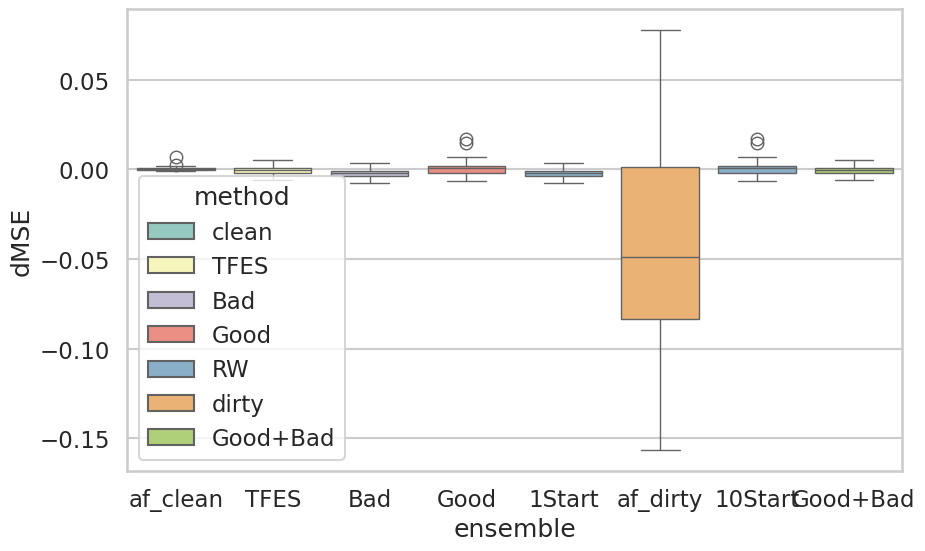

In [203]:
methord_order = ["RW"]
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

fit_val_df = mean_dMSE_df[mean_dMSE_df["dataset"] == "val"]


sns.boxplot(data=mean_dMSE_df, x="ensemble", y="dMSE", hue="method", ax=ax, palette="Set3")#,order=method_order)
 
# ax.set_yscale("log")

plt.show()


In [18]:

data_frames = []

for csv in csvs:
    data_frames.append(pd.read_csv(csv))

df = pd.concat(data_frames)
df.head()



,time,Type,R,calc_name,mse,name,system,analysis,split_type,protein,name_name,dataset,class
0,0.5,Train,-0.150561,train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,RW,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
1,0.5,Val,-0.252517,val_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,RW,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s
2,0.5,Train,-0.156766,train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,RW,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
3,0.5,Val,-0.200413,val_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,RW,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s
4,0.5,Train,-0.134732,train_MBP_af_clean_3,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,RW,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s


In [19]:
#
df["method"] = df["name"].apply(lambda x: x.split("_")[2])

In [20]:
df["fit"] = df["name"].apply(lambda x: x.split("_")[4])

In [21]:
print(df["fit"].unique())    

['bench' 's' 'Sp' 'R3' 'r']


In [22]:
protein_names = ["MBP", "MBP", "BRD4", "LXRa", "MBP"]

df['protein'] = df['name'].apply(lambda x: x.split('_')[0])
df

,time,Type,R,calc_name,mse,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit
0,0.5,Train,-0.150561,train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,bench
1,0.5,Val,-0.252517,val_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
2,0.5,Train,-0.156766,train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,bench
3,0.5,Val,-0.200413,val_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
4,0.5,Train,-0.134732,train_MBP_af_clean_3,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,bench
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34,30.0,Train,NaN,train_MBP_MD_Good+Bad_2,0.112577,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,bench
35,30.0,Train,NaN,train_MBP_MD_Good+Bad_3,0.089743,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,bench
36,30.0,Val,NaN,val_MBP_MD_Good+Bad_1,0.093013,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench
37,30.0,Val,NaN,val_MBP_MD_Good+Bad_2,0.080790,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench


In [23]:
# only include df that has non nan mse values
mse_df = df.dropna(subset=["mse"])
val_df = mse_df[mse_df["Type"] == "Val"]

# remove val mse = 0
val_df = val_df[val_df["mse"] != 0]


print(val_df.method.value_counts())

method
RW          72
clean       36
TFES        36
Bad         36
Good        36
dirty       36
Good+Bad    36
Name: count, dtype: int64


In [24]:
val_df



,time,Type,R,calc_name,mse,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit
22,0.5,Val,NaN,val_MBP_af_clean_1,0.147585,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
23,0.5,Val,NaN,val_MBP_af_clean_2,0.165188,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
24,0.5,Val,NaN,val_MBP_af_clean_3,0.158199,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
29,4.0,Val,NaN,val_MBP_af_clean_1,0.166954,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
30,4.0,Val,NaN,val_MBP_af_clean_2,0.179638,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_val_M...,val,val_s,clean,bench
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30,4.0,Val,NaN,val_MBP_MD_Good+Bad_2,0.112263,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench
31,4.0,Val,NaN,val_MBP_MD_Good+Bad_3,0.159152,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench
36,30.0,Val,NaN,val_MBP_MD_Good+Bad_1,0.093013,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench
37,30.0,Val,NaN,val_MBP_MD_Good+Bad_2,0.080790,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_val_MB...,val,val_r,Good+Bad,bench


In [25]:
val_df.columns

Index(['time', 'Type', 'R', 'calc_name', 'mse', 'name', 'system', 'analysis',
       'split_type', 'protein', 'name_name', 'dataset', 'class', 'method',
       'fit'],
      dtype='object')

In [26]:
val_df = transform_naming(val_df)
print(val_df["method"].unique())

['clean' 'TFES' 'Bad' 'Good' 'RW' 'dirty' 'Good+Bad']


In [27]:
split_order = ["r", "s", "R3", "Sp"]


['af_clean' 'TFES' 'Bad' 'Good' '1Start' 'af_dirty' '10Start' 'Good+Bad']


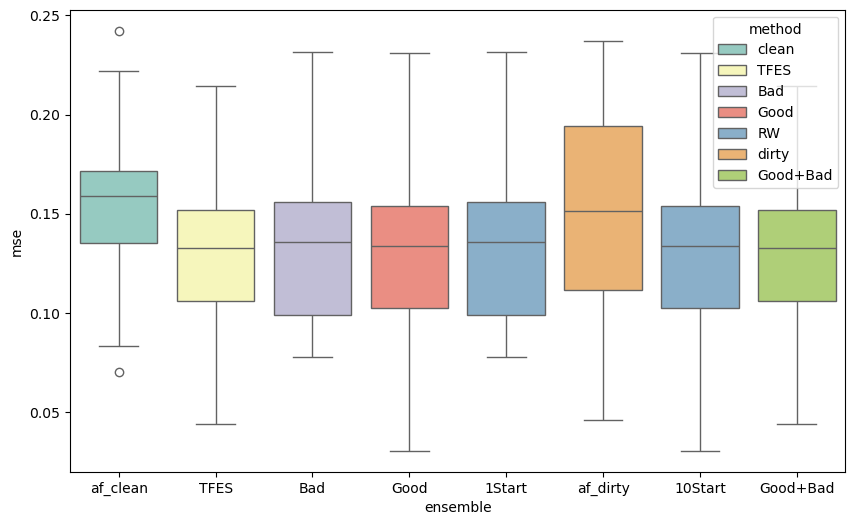

In [28]:
methord_order = ["RW"]
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

fit_val_df = val_df[val_df["replicate"] != 0]
print(fit_val_df["ensemble"].unique())

sns.boxplot(data=val_df, x="ensemble", y="mse", hue="method", ax=ax, palette="Set3")#,order=method_order)

# ax.set_yscale("log")

plt.show()


In [29]:
fit_val_df = val_df
fit_val_df["ensemble"].unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [30]:

# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# shaw_free_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
# shaw_free_val_df = val_df[val_df["ensemble"].isin(shaw_free_dataset_order)]
# palette = sns.color_palette("Set1", n_colors=len(val_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(shaw_free_val_df, row="protein", col="split_type", height=5, aspect=1.5, sharey=False, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="mse", hue="replicate", palette="Set2", order=shaw_free_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Dataset", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.add_legend(title="Replicate", fontsize=12)
# # Show the plot
# plt.show()

In [31]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")

# # protein_names = ["MBP", "MBP", "BRD4", "LXRa", "MBP"]
# # method_order = ["NoOpt0", "BV-RW0", "BV-RW1","RW-BV-RW0","RW-BV-RW1","RW-BV-RW2", "RW-SpBV-RW0","RW-SpBV-RW1","RW-SpBV-RW2", "BV+RW0"]
# shaw_free_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# # Create a custom palette
# split_order = ["r", "s", "R3", "Sp"]
# # fit_val_df["method_name"] = fit_val_df["method"].apply(lambda x: x[:-1])
# palette = sns.color_palette("Set1", n_colors=len(val_df["ensemble"].unique()))

# # Create the FacetGrid
# g = sns.FacetGrid(val_df, col="protein", col_wrap=1, height=5, aspect=3, sharey=False, col_order=protein_names)

# # Map the violin plot to the FacetGrid
# g.map_dataframe(sns.violinplot, x="split_type", y="mse", hue="ensemble", palette=palette, hue_order=shaw_free_dataset_order, order=split_order)

# # Customize the plot
# g.set_titles(col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Method", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # g.add_legend(title="Split Type", fontsize=12)

# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

# # Adjust subplot spacing
# g.tight_layout()
# g.add_legend(title="ensemble", fontsize=12)

# # Show the plot
# plt.show()

In [32]:
print(val_df.method.value_counts())

method
RW          72
clean       36
TFES        36
Bad         36
Good        36
dirty       36
Good+Bad    36
Name: count, dtype: int64


In [33]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean"]# "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# shaw_free_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_val_df = val_df[val_df["ensemble"].isin(_dataset_order)]
# palette = sns.color_palette("Set1", n_colors=len(val_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_val_df, row="protein", col="split_type", height=5, aspect=1.5, sharey=False, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="mse", hue="replicate", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("ensemble", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.add_legend(title="Replicate", fontsize=12)
# # Show the plot
# plt.show()

In [34]:
expt_segs = pkl_list["expt_segs"]
weightslog_PFs = pkl_list["LogPfs"]
print(expt_segs.columns)
# print(log_PFs.columns)

Index(['ResStr', 'ResEnd', 'peptide', 'calc_name', 'Residue', 'name', 'system',
       'analysis', 'split_type', 'protein', 'name_name', 'dataset', 'class'],
      dtype='object')


In [35]:
expt_segs

,ResStr,ResEnd,peptide,calc_name,Residue,name,system,analysis,split_type,protein,name_name,dataset,class
0,19,30,0,Experimental,"(19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30)",MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
1,19,31,1,Experimental,"(19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 3...",MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
2,24,35,2,Experimental,"(24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35)",MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
3,31,53,3,Experimental,"(31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 4...",MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
4,32,46,4,Experimental,"(32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 4...",MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3675,357,372,110,Experimental,"(357, 358, 359, 360, 361, 362, 363, 364, 365, ...",MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_Experi...,Experimental,Experimental_r
3676,362,370,111,Experimental,"(362, 363, 364, 365, 366, 367, 368, 369, 370)",MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_Experi...,Experimental,Experimental_r
3677,362,372,112,Experimental,"(362, 363, 364, 365, 366, 367, 368, 369, 370, ...",MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_Experi...,Experimental,Experimental_r
3678,362,377,113,Experimental,"(362, 363, 364, 365, 366, 367, 368, 369, 370, ...",MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_Experi...,Experimental,Experimental_r


In [36]:
log_PFs = pkl_list["LogPfs"]
log_PFs = transform_naming(log_PFs)
print(log_PFs.ensemble.unique())
print(len(log_PFs.ensemble.unique()))
print(log_PFs.ensemble.value_counts())

['af_clean' 'TFES' 'Bad' 'Good' '1Start' 'af_dirty' '10Start' 'Good+Bad']
8
ensemble
Bad         9671
1Start      9671
af_clean    9647
af_dirty    9647
TFES        9629
Good+Bad    9629
Good        9626
10Start     9626
Name: count, dtype: int64


In [37]:
log_PFs

,Residues,LogPf,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit,ensemble,replicate
0,20,1.499000,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
1,21,1.646500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
2,22,2.022500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
3,23,2.396500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
4,24,2.201500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77141,373,10.601073,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77142,374,9.187427,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77143,375,11.907128,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77144,376,15.018179,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3


In [38]:
# # plot LogPf vs Residues, facet by protein and split type
# # plot as a bar plot
# import seaborn as sns
# continue
# sns.set_context("talk")

# _dataset_order = ["af_dirty", "af_clean"]# "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]

# _log_PFs = log_PFs[log_PFs["dataset"]=="val"]

# _log_PFs = log_PFs[log_PFs["ensemble"].isin(_dataset_order)]
# g = sns.FacetGrid(_log_PFs, col="ensemble", row="protein", height=5, aspect=2.5, sharey=True, sharex=False)#, row_order=protein_names, col_order=protein_names)

# g.map_dataframe(sns.barplot, x="Residues", y="LogPf", hue="split_type", palette="Set2")

# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")

# g.set_xlabels("Residue")#, fontsize=14)

# g.set_ylabels("LogPf", fontsize=14)

# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

# g.tight_layout()

# g.add_legend(title="Replicate", fontsize=12)

# plt.show()







In [39]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# continue
# sns.set_context("talk")

# dataset_order = ["af_dirty", "af_clean"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]

# _log_PFs = log_PFs[log_PFs["ensemble"].isin(dataset_order)]
# _log_PFs = log_PFs[log_PFs["dataset"]=="val"]

# # Create a separate figure for each protein
# for protein in _log_PFs["protein"].unique():
#     protein_data = _log_PFs[_log_PFs["protein"] == protein]
    
#     g = sns.FacetGrid(protein_data, col="ensemble", row="split_type", height=5, aspect=4, 
#                       sharey=True, sharex=True, col_order=dataset_order)
    
#     g.map_dataframe(sns.barplot, x="Residues", y="LogPf", hue="replicate", palette="Set2")
    
#     g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
#     g.set_xlabels("Residue")#, fontsize=14)
#     g.set_ylabels("LogPf", fontsize=14)
    

#     g.tight_layout()
#     g.add_legend(title="Replicate", fontsize=12)
    
#     plt.suptitle(f"Protein: {protein}", fontsize=20, y=1.02)
#     plt.show()

In [40]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# continue
# sns.set_context("talk")

# dataset_order = ["af_dirty", "af_clean"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]

# _log_PFs = log_PFs[log_PFs["ensemble"].isin(dataset_order)]
# _log_PFs = log_PFs[log_PFs["dataset"]=="test"]

# # Create a separate figure for each protein
# for protein in _log_PFs["protein"].unique():
#     protein_data = _log_PFs[_log_PFs["protein"] == protein]
    
#     g = sns.FacetGrid(protein_data, col="ensemble", row="split_type", height=5, aspect=4, 
#                       sharey=True, sharex=True, col_order=dataset_order)
    
#     g.map_dataframe(sns.barplot, x="Residues", y="LogPf", palette="Set2")
    
#     g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
#     g.set_xlabels("Residue")#, fontsize=14)
#     g.set_ylabels("LogPf", fontsize=14)
    

#     g.tight_layout()
#     g.add_legend(title="Replicate", fontsize=12)
    
#     plt.suptitle(f"Protein: {protein}", fontsize=20, y=1.02)
#     plt.show()

In [41]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.set_context("talk")

# dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]

# _log_PFs = log_PFs[log_PFs["ensemble"].isin(dataset_order)]

# # Create a separate figure for each protein
# for protein in _log_PFs["protein"].unique():
#     protein_data = _log_PFs[_log_PFs["protein"] == protein]
    
#     g = sns.FacetGrid(protein_data, col="ensemble", row="split_type", height=5, aspect=4, 
#                       sharey=False, sharex=False, col_order=dataset_order)
    
#     g.map_dataframe(sns.barplot, x="Residues", y="LogPf", palette="Set2")
    
#     g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
#     g.set_xlabels("Residue")#, fontsize=14)
#     g.set_ylabels("LogPf", fontsize=14)
    

#     g.tight_layout()
#     g.add_legend(title="Replicate", fontsize=12)
    
#     plt.suptitle(f"Protein: {protein}", fontsize=20, y=1.02)
#     plt.show()

In [42]:

weights

,weights,calc_name,likelihood,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit,ensemble,replicate
0,"[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0...",prior_MBP_af_clean,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,clean
1,"[0.0063801707745615955, 0.018077639361661648, ...",train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
2,NaN,train_MBP_af_clean_1,1.373802,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
3,"[0.00933146331190233, 0.014783373506387993, 0....",train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
4,NaN,train_MBP_af_clean_2,1.307976,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,NaN,train_MBP_MD_Good+Bad_1,1.837438,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,1
220,"[0.007021383886910677, 0.010147186629685633, 0...",train_MBP_MD_Good+Bad_2,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
221,NaN,train_MBP_MD_Good+Bad_2,1.632295,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
222,"[0.012281006634916224, 0.0070802107609930385, ...",train_MBP_MD_Good+Bad_3,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,3


In [43]:
# explode "weights" array in weights dataframe - such that each element in the array is a new row - labelled by array index in the "frame" column



In [44]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame called 'weights' with a column 'weights' containing arrays
# If not, you can create a sample DataFrame like this:
# weights = pd.DataFrame({'weights': [[1, 2, 3], [4, 5], [6, 7, 8, 9]]})

# Explode the 'weights' column
exploded = weights.explode('weights')

# Reset the index and rename it to 'frame'
exploded = exploded.reset_index().rename(columns={'index': 'frame'})

# If you want 'frame' to represent the index within each array instead of the original DataFrame index,
# you can modify it like this:
exploded['frame'] = exploded.groupby('frame').cumcount()

# Reset the index again to have a clean numeric index
exploded = exploded.reset_index(drop=True)

# Display the result
print(exploded)

       frame   weights                calc_name  likelihood  \
0          0      0.01       prior_MBP_af_clean         NaN   
1          1      0.01       prior_MBP_af_clean         NaN   
2          2      0.01       prior_MBP_af_clean         NaN   
3          3      0.01       prior_MBP_af_clean         NaN   
4          4      0.01       prior_MBP_af_clean         NaN   
...      ...       ...                      ...         ...   
12891     96  0.018715  train_MBP_MD_Good+Bad_3         NaN   
12892     97    0.0077  train_MBP_MD_Good+Bad_3         NaN   
12893     98  0.009849  train_MBP_MD_Good+Bad_3         NaN   
12894     99  0.012619  train_MBP_MD_Good+Bad_3         NaN   
12895      0       NaN  train_MBP_MD_Good+Bad_3    1.443692   

                                           name  \
0      MBP_af_clean_RW_bench_s_naive_sequential   
1      MBP_af_clean_RW_bench_s_naive_sequential   
2      MBP_af_clean_RW_bench_s_naive_sequential   
3      MBP_af_clean_RW_bench_s_naive_se

In [45]:
exploded.frame.value_counts()

frame
0     224
63    128
73    128
72    128
71    128
     ... 
30    128
29    128
28    128
27    128
99    128
Name: count, Length: 100, dtype: int64

In [46]:
# # plot LogPf vs Residues, facet by protein and split type
# # plot as a bar plot
# import seaborn as sns
# continue
# sns.set_context("talk")
# _dataset_order = ["af_dirty", "af_clean"]# "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _exploded = exploded[exploded["ensemble"].isin(_dataset_order)]
# g = sns.FacetGrid(_exploded, col="ensemble", row="protein", height=5, aspect=4, sharey=False)#, sharex=False)#, row_order=protein_names, col_order=protein_names)

# g.map_dataframe(sns.barplot, x="frame", y="weights", hue="split_type", palette="Set2")

# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")

# g.set_xlabels("frame")#, fontsize=14)

# g.set_ylabels("weight", fontsize=14)

# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

# g.tight_layout()

# g.add_legend(title="Replicate", fontsize=12)

# plt.show()







In [47]:
log_PFs



,Residues,LogPf,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit,ensemble,replicate
0,20,1.499000,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
1,21,1.646500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
2,22,2.022500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
3,23,2.396500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
4,24,2.201500,prior_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77141,373,10.601073,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77142,374,9.187427,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77143,375,11.907128,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3
77144,376,15.018179,test_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_test_M...,test,test_r,Good+Bad,RW,Good+Bad,3


In [48]:
weights

,weights,calc_name,likelihood,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit,ensemble,replicate
0,"[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0...",prior_MBP_af_clean,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,clean
1,"[0.0063801707745615955, 0.018077639361661648, ...",train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
2,NaN,train_MBP_af_clean_1,1.373802,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
3,"[0.00933146331190233, 0.014783373506387993, 0....",train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
4,NaN,train_MBP_af_clean_2,1.307976,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,NaN,train_MBP_MD_Good+Bad_1,1.837438,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,1
220,"[0.007021383886910677, 0.010147186629685633, 0...",train_MBP_MD_Good+Bad_2,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
221,NaN,train_MBP_MD_Good+Bad_2,1.632295,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
222,"[0.012281006634916224, 0.0070802107609930385, ...",train_MBP_MD_Good+Bad_3,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,3


In [49]:
(features)

,sum_contacts,sum_hbonds,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class
0,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
1,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
2,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_r_naive_random,MBP_af_clean_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_af_clean_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
3,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_Sp_res_neighbours,MBP_af_clean_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_af_clean_RW_bench_Sp_res_neighbours_Experi...,Experimental,Experimental_Sp
4,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_Sp_res_neighbours,MBP_MD_TFES_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_TFES_RW_bench_Sp_res_neighbours_Experim...,Experimental,Experimental_Sp
5,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_R3_k_sequence,MBP_MD_TFES_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_MD_TFES_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
6,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_r_naive_random,MBP_MD_TFES_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_TFES_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
7,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_s_naive_sequential,MBP_MD_TFES_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_MD_TFES_RW_bench_s_naive_sequential_Experi...,Experimental,Experimental_s
8,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_r_naive_random,MBP_MD_Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Bad_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
9,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_Sp_res_neighbours,MBP_MD_Bad_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_Bad_RW_bench_Sp_res_neighbours_Experime...,Experimental,Experimental_Sp


In [50]:
BV_constants = pkl_list["BV_constants"]

BV_constants

,Bc,Bh,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class
0,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s
1,0.35,2.0,train_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
2,0.35,2.0,train_MBP_af_clean_2,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
3,0.35,2.0,train_MBP_af_clean_3,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s
4,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_prior_MBP_...,prior,prior_R3
...,...,...,...,...,...,...,...,...,...,...,...
123,0.35,2.0,train_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_MD_Good+Bad_RW_bench_s_naive_sequential_tr...,train,train_s
124,0.35,2.0,prior_MBP_MD_Good+Bad,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_prior_...,prior,prior_r
125,0.35,2.0,train_MBP_MD_Good+Bad_1,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r
126,0.35,2.0,train_MBP_MD_Good+Bad_2,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r


In [51]:
weights

,weights,calc_name,likelihood,name,system,analysis,split_type,protein,name_name,dataset,class,method,fit,ensemble,replicate
0,"[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.0...",prior_MBP_af_clean,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,prior_s,clean,RW,af_clean,clean
1,"[0.0063801707745615955, 0.018077639361661648, ...",train_MBP_af_clean_1,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
2,NaN,train_MBP_af_clean_1,1.373802,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,1
3,"[0.00933146331190233, 0.014783373506387993, 0....",train_MBP_af_clean_2,NaN,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
4,NaN,train_MBP_af_clean_2,1.307976,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,train_s,clean,RW,af_clean,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,NaN,train_MBP_MD_Good+Bad_1,1.837438,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,1
220,"[0.007021383886910677, 0.010147186629685633, 0...",train_MBP_MD_Good+Bad_2,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
221,NaN,train_MBP_MD_Good+Bad_2,1.632295,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,2
222,"[0.012281006634916224, 0.0070802107609930385, ...",train_MBP_MD_Good+Bad_3,NaN,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,train_r,Good+Bad,RW,Good+Bad,3


In [52]:
features

,sum_contacts,sum_hbonds,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class
0,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
1,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
2,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_r_naive_random,MBP_af_clean_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_af_clean_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
3,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_Sp_res_neighbours,MBP_af_clean_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_af_clean_RW_bench_Sp_res_neighbours_Experi...,Experimental,Experimental_Sp
4,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_Sp_res_neighbours,MBP_MD_TFES_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_TFES_RW_bench_Sp_res_neighbours_Experim...,Experimental,Experimental_Sp
5,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_R3_k_sequence,MBP_MD_TFES_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_MD_TFES_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
6,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_r_naive_random,MBP_MD_TFES_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_TFES_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
7,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_s_naive_sequential,MBP_MD_TFES_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_MD_TFES_RW_bench_s_naive_sequential_Experi...,Experimental,Experimental_s
8,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_r_naive_random,MBP_MD_Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Bad_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
9,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_Sp_res_neighbours,MBP_MD_Bad_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_Bad_RW_bench_Sp_res_neighbours_Experime...,Experimental,Experimental_Sp


In [53]:
weights.system.unique()


array(['MBP_af_clean_RW_bench_s_naive_sequential',
       'MBP_af_clean_RW_bench_R3_k_sequence',
       'MBP_af_clean_RW_bench_r_naive_random',
       'MBP_af_clean_RW_bench_Sp_res_neighbours',
       'MBP_MD_TFES_RW_bench_Sp_res_neighbours',
       'MBP_MD_TFES_RW_bench_R3_k_sequence',
       'MBP_MD_TFES_RW_bench_r_naive_random',
       'MBP_MD_TFES_RW_bench_s_naive_sequential',
       'MBP_MD_Bad_RW_bench_r_naive_random',
       'MBP_MD_Bad_RW_bench_Sp_res_neighbours',
       'MBP_MD_Bad_RW_bench_s_naive_sequential',
       'MBP_MD_Bad_RW_bench_R3_k_sequence',
       'MBP_MD_Good_RW_bench_R3_k_sequence',
       'MBP_MD_Good_RW_bench_Sp_res_neighbours',
       'MBP_MD_Good_RW_bench_s_naive_sequential',
       'MBP_MD_Good_RW_bench_r_naive_random',
       'MBP_1Start_RW_bench_s_naive_sequential',
       'MBP_1Start_RW_bench_Sp_res_neighbours',
       'MBP_1Start_RW_bench_R3_k_sequence',
       'MBP_1Start_RW_bench_r_naive_random',
       'MBP_af_dirty_RW_bench_Sp_res_neighbours',
    

In [54]:
features

,sum_contacts,sum_hbonds,calc_name,name,system,analysis,split_type,protein,name_name,dataset,class
0,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_Exper...,Experimental,Experimental_s
1,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
2,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_r_naive_random,MBP_af_clean_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_af_clean_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
3,"[7815.0, 7997.0, 7979.0, 7921.0, 8000.0, 8076....","[211.0, 234.0, 221.0, 225.0, 230.0, 233.0, 223...",Experimental,MBP_af_clean_RW_bench_Sp_res_neighbours,MBP_af_clean_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_af_clean_RW_bench_Sp_res_neighbours_Experi...,Experimental,Experimental_Sp
4,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_Sp_res_neighbours,MBP_MD_TFES_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_TFES_RW_bench_Sp_res_neighbours_Experim...,Experimental,Experimental_Sp
5,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_R3_k_sequence,MBP_MD_TFES_RW_bench_R3_k_sequence,RW_bench,R3,MBP,MBP_MD_TFES_RW_bench_R3_k_sequence_Experimental,Experimental,Experimental_R3
6,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_r_naive_random,MBP_MD_TFES_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_TFES_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
7,"[7322.0, 7253.0, 7390.0, 7430.0, 7381.0, 7368....","[204.0, 206.0, 224.0, 219.0, 223.0, 222.0, 220...",Experimental,MBP_MD_TFES_RW_bench_s_naive_sequential,MBP_MD_TFES_RW_bench_s_naive_sequential,RW_bench,s,MBP,MBP_MD_TFES_RW_bench_s_naive_sequential_Experi...,Experimental,Experimental_s
8,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_r_naive_random,MBP_MD_Bad_RW_bench_r_naive_random,RW_bench,r,MBP,MBP_MD_Bad_RW_bench_r_naive_random_Experimental,Experimental,Experimental_r
9,"[7518.0, 7310.0, 7338.0, 7554.0, 7361.0, 7294....","[215.0, 213.0, 214.0, 222.0, 204.0, 215.0, 221...",Experimental,MBP_MD_Bad_RW_bench_Sp_res_neighbours,MBP_MD_Bad_RW_bench_Sp_res_neighbours,RW_bench,Sp,MBP,MBP_MD_Bad_RW_bench_Sp_res_neighbours_Experime...,Experimental,Experimental_Sp


In [55]:
BV_constants.system.unique()

array(['MBP_af_clean_RW_bench_s_naive_sequential',
       'MBP_af_clean_RW_bench_R3_k_sequence',
       'MBP_af_clean_RW_bench_r_naive_random',
       'MBP_af_clean_RW_bench_Sp_res_neighbours',
       'MBP_MD_TFES_RW_bench_Sp_res_neighbours',
       'MBP_MD_TFES_RW_bench_R3_k_sequence',
       'MBP_MD_TFES_RW_bench_r_naive_random',
       'MBP_MD_TFES_RW_bench_s_naive_sequential',
       'MBP_MD_Bad_RW_bench_r_naive_random',
       'MBP_MD_Bad_RW_bench_Sp_res_neighbours',
       'MBP_MD_Bad_RW_bench_s_naive_sequential',
       'MBP_MD_Bad_RW_bench_R3_k_sequence',
       'MBP_MD_Good_RW_bench_R3_k_sequence',
       'MBP_MD_Good_RW_bench_Sp_res_neighbours',
       'MBP_MD_Good_RW_bench_s_naive_sequential',
       'MBP_MD_Good_RW_bench_r_naive_random',
       'MBP_1Start_RW_bench_s_naive_sequential',
       'MBP_1Start_RW_bench_Sp_res_neighbours',
       'MBP_1Start_RW_bench_R3_k_sequence',
       'MBP_1Start_RW_bench_r_naive_random',
       'MBP_af_dirty_RW_bench_Sp_res_neighbours',
    

In [56]:
expt_segs = pkl_list["expt_segs"]
expt_segs

proteins_num_res = {}

for protein_name in protein_names:
    protein_expt_segs = expt_segs[expt_segs["protein"] == protein_name]

    residue_lists = protein_expt_segs["Residue"].unique()
    # expand list of list
    residues = [residue for residue_list in residue_lists for residue in residue_list]
    residues = list(set(residues))
    proteins_num_res[protein_name] = len(residues)

def calc_energy(features: pd.DataFrame, BV_constants: pd.DataFrame, weights: pd.DataFrame, R=8.31, T=300) -> pd.DataFrame:
    """
    Calculate the energy of the system from the dataframes provided.
    Features contains the sum of the contacts/hbonds for each system,
    these are multiplied by the BV Bc and Bh constants respectively.
    Weights are simply added to the dataframe aligned by calc_name.
    sum_contacts, sum_hbonds, Bc, Bh, weights are arrays of the same length.
    Features are aligned based on "system" as there are multiple replicates designated by calc_name in BV_constants and weights.
    Returns a dataframe with the energy for each system and calc_name.
    """
    # merge BV_constants and weights on calc_name
    # select weights and calc_name columns 
    weights = weights[["calc_name", "weights"]]

    merged = pd.concat([BV_constants, weights], axis=1, join="inner")
    print(merged.columns)
    print(merged.system.value_counts())

    systems = features.system.unique()
    # iterate through the systems
    features = features[['system', 'sum_contacts', 'sum_hbonds']]

    data_frames = []

    for system in systems:
        print(system)
        system_features = features[features["system"] == system]

        # get the sum_contacts and sum_hbonds
        sum_contacts = system_features["sum_contacts"].to_list()
        sum_hbonds = system_features["sum_hbonds"].to_list()

        system_merged = merged[merged["system"] == system]

        # add the sum_contacts and sum_hbonds to the system_merged
        system_merged["sum_contacts"] = sum_contacts*len(system_merged)
        system_merged["sum_hbonds"] = sum_hbonds*len(system_merged)

        protein = system_merged["protein"].values[0]

        num_res = proteins_num_res[protein]


        # calculate the energy
        system_merged["energy"] = (system_merged["Bc"]*system_merged["sum_contacts"] + system_merged["Bh"]*system_merged["sum_hbonds"])*R*T/num_res

        # multiply each element in the weights array by the energy and sum

        system_merged["weighted_energy"] = system_merged["weights"]*system_merged["energy"]

        system_merged["mean_energy"] = system_merged["weighted_energy"].apply(lambda x: np.sum(x))

        data_frames.append(system_merged)


    merged = pd.concat(data_frames)
 
    # remove duplicate columns
    merged = merged.loc[:,~merged.columns.duplicated()]

    return merged




energy_df = calc_energy(features, BV_constants, weights)

energy_df = transform_naming(energy_df)
energy_df["replicate"] = energy_df["calc_name"].apply(lambda x: x.split("_")[-1])

Index(['Bc', 'Bh', 'calc_name', 'name', 'system', 'analysis', 'split_type',
       'protein', 'name_name', 'dataset', 'class', 'calc_name', 'weights'],
      dtype='object')
system
MBP_af_clean_RW_bench_s_naive_sequential       4
MBP_af_clean_RW_bench_R3_k_sequence            4
MBP_MD_Good+Bad_RW_bench_s_naive_sequential    4
MBP_MD_Good+Bad_RW_bench_R3_k_sequence         4
MBP_MD_Good+Bad_RW_bench_Sp_res_neighbours     4
MBP_10Start_RW_bench_R3_k_sequence             4
MBP_10Start_RW_bench_Sp_res_neighbours         4
MBP_10Start_RW_bench_s_naive_sequential        4
MBP_10Start_RW_bench_r_naive_random            4
MBP_af_dirty_RW_bench_R3_k_sequence            4
MBP_af_dirty_RW_bench_r_naive_random           4
MBP_af_dirty_RW_bench_s_naive_sequential       4
MBP_af_dirty_RW_bench_Sp_res_neighbours        4
MBP_1Start_RW_bench_r_naive_random             4
MBP_1Start_RW_bench_R3_k_sequence              4
MBP_1Start_RW_bench_Sp_res_neighbours          4
MBP_1Start_RW_bench_s_naive_sequent

/tmp/ipykernel_2625344/2651857176.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  system_merged["sum_contacts"] = sum_contacts*len(system_merged)
/tmp/ipykernel_2625344/2651857176.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  system_merged["sum_hbonds"] = sum_hbonds*len(system_merged)
/tmp/ipykernel_2625344/2651857176.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [57]:
# features[features["name"]=="MBP_MD_Good+Bad_RW_bench_s_naive_sequential"].sum_contacts.values

In [58]:
energy_df.ensemble.unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [59]:
# def calc_KL_divergence(energy_df: pd.DataFrame, key="weights"):
#     """Calculates the KL divergence for the energy dataframe provided.
#     The key is the column in the energy_df that contains the weights.
#     The divergence is calculated for each array in the weights column
#     and is calculated between the weights and a uniform distribution of the same length.
#     """



#     energy_df["KL"]= energy_df[key].apply(lambda x: np.sum(x*np.log(x/len(x))))  

#     return energy_df


# energy_df = calc_KL_divergence(energy_df)

# energy_df

In [60]:
# import numpy as np
# from scipy.special import rel_entr

# def calc_KL_divergence(energy_df: pd.DataFrame, key="weights", T=300):
#     """
#     Calculates the KL divergence for the energy dataframe provided.
#     The key is the column in the energy_df that contains the weights.
#     The divergence is calculated for each array in the weights column
#     and is calculated between the weights and a uniform distribution of the same length.
#     """
#     def kl_divergence(p, q):
#         return np.sum(rel_entr(p, q))

#     kl_divergences = []

#     for weights in energy_df[key]:
#         # Convert weights to numpy array if it's not already
#         weights = np.array(weights)
        
#         # Normalize weights to sum to 1
#         weights = weights / np.sum(weights)
        
#         # Create uniform distribution of same length
#         uniform = np.ones_like(weights) / len(weights)
        
#         # Calculate KL divergence
#         kl_div = kl_divergence(weights, uniform)
        
#         kl_divergences.append(kl_div)

#     # Add KL divergence as a new column to the dataframe
#     energy_df['KL_divergence'] = kl_divergences
#     # conver to % using 100*(1-e^(-KL))
#     energy_df['%_KL_divergence'] = 100*(1-np.exp(-energy_df['KL_divergence']))

#     return energy_df

# # Usage:
# energy_df = calc_KL_divergence(energy_df)

In [61]:
import numpy as np
from scipy.constants import Boltzmann

def calc_absolute_entropy(energy_df: pd.DataFrame, key="weights", R=8.31):
    """
    Calculates the absolute entropy for the energy dataframe provided.
    The key is the column in the energy_df that contains the weights.
    The entropy is calculated for each array in the weights column.
    
    Parameters:
    energy_df (pd.DataFrame): DataFrame containing the weights
    key (str): Column name for the weights
    T (float): Temperature in Kelvin
    
    Returns:
    pd.DataFrame: Original dataframe with added entropy columns
    """
    
    def entropy(p):
        # Avoid log(0) by adding a small constant
        return -np.sum(p * np.log(p + 1e-10))
    
    entropies = []
    for weights in energy_df[key]:
        # Convert weights to numpy array if it's not already
        weights = np.array(weights)
        
        # Normalize weights to sum to 1
        weights = weights / np.sum(weights)
        
        # Calculate entropy
        S = entropy(weights)
        entropies.append(S)
    
    # Add entropy as a new column to the dataframe
    energy_df['Entropy_nats'] = entropies
    
    # Convert entropy to J/K/mol
    energy_df['Entropy_JKmol'] = energy_df['Entropy_nats'] * R
    


    return energy_df

# Usage:
energy_df = calc_absolute_entropy(energy_df)

In [62]:
# import numpy as np
# from scipy.spatial.distance import jensenshannon
# import pandas as pd

# def calc_JS_divergence(energy_df: pd.DataFrame, key="weights"):
#     """
#     Calculates the Jensen-Shannon divergence for the energy dataframe provided.
#     The key is the column in the energy_df that contains the weights.
#     The divergence is calculated for each array in the weights column
#     and is calculated between the weights and a uniform distribution of the same length.
#     """
#     js_divergences = []
    
#     for weights in energy_df[key]:
#         # Convert weights to numpy array if it's not already
#         weights = np.array(weights)
        
#         # Normalize weights to sum to 1
#         weights = weights / np.sum(weights)
        
#         # Create uniform distribution of same length
#         uniform = np.ones_like(weights) / len(weights)
        
#         # Calculate JS divergence
#         js_div = jensenshannon(weights, uniform)
        
#         js_divergences.append(js_div)
    
#     # Add JS divergence as a new column to the dataframe
#     energy_df['JS_divergence'] = js_divergences
    
#     return energy_df

# # Usage:
# energy_df = calc_JS_divergence(energy_df)

In [63]:
def calc_energy_difference(energy_df: pd.DataFrame, dataset="prior", key="mean_energy", T=300, R=8.31):
    """
    Calculates the energy change upon reweighting from the prior
    """

    systems = energy_df.system.unique()


    dfs= []
    for system in systems:
        # print(system)
        system_df = energy_df[energy_df["system"] == system]
        prior = system_df[system_df["dataset"] == dataset]
        prior_energy = prior[key].values
        # print(prior_energy)
        system_df["signed_energy_difference"] = system_df[key].values - prior_energy
        # take absolute value
        system_df["energy_difference"] = system_df["signed_energy_difference"].apply(lambda x: np.abs(x))
        # print(system_df["energy_difference"])
        system_df["%_energy_difference"] = system_df["energy_difference"].apply(lambda x: 100*x/np.abs(prior_energy))

        # convert %_energy_difference from a list
        system_df["%_energy_difference"] = system_df["%_energy_difference"].apply(lambda x: x[0])



        system_df["ratio_energy_difference"] = system_df["%_energy_difference"].apply(lambda x: x/100+1)


        system_df["entropy_difference"] = system_df["Entropy_JKmol"].values - prior["Entropy_JKmol"].values

        system_df["signed_enthalpy"] = system_df["signed_energy_difference"] 

        print(system_df.entropy_difference.values)

        system_df["gibbs_free_energy"] = system_df["energy_difference"] - T*system_df["entropy_difference"]

        # convert to equilibrium constant
        system_df["equilibrium_constant"] = system_df["gibbs_free_energy"].apply(lambda x: np.exp(-x/(R*T)))


   
        dfs.append(system_df)

    energy_df = pd.concat(dfs)

    return energy_df

energy_df = calc_energy_difference(energy_df)

energy_df.columns

[ 0.         -0.42181453         nan -0.33622928]
[nan nan nan nan]
[ 0.                 nan -0.53030585         nan]
[0.                nan 0.8907622  0.70543833]
[nan nan nan nan]
[nan nan nan nan]
[0.                nan 0.45965008        nan]
[ 0.         -2.22307413         nan -6.15414499]
[nan nan nan nan]
[0.                nan 1.01009347        nan]
[ 0.                 nan  2.35254794 -0.07315021]
[nan nan nan nan]
[nan nan nan nan]
[0.                nan 0.89470549        nan]
[ 0.         -3.9191539          nan -3.29451455]
[nan nan nan nan]
[ 0.                 nan -1.38291985         nan]
[ 0.                 nan  2.2758415  -2.83239865]
[nan nan nan nan]
[nan nan nan nan]
[ 0.                 nan -0.70934469         nan]
[ 0.         -2.67181587         nan -3.27156933]
[nan nan nan nan]
[ 0.                 nan -1.68579569         nan]
[ 0.                 nan  1.85460039 -1.61280311]
[nan nan nan nan]
[nan nan nan nan]
[0.                nan 1.31577258        nan]
[ 0.

/tmp/ipykernel_2625344/4026106190.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  system_df["signed_energy_difference"] = system_df[key].values - prior_energy
/tmp/ipykernel_2625344/4026106190.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  system_df["energy_difference"] = system_df["signed_energy_difference"].apply(lambda x: np.abs(x))
/tmp/ipykernel_2625344/4026106190.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

Index(['Bc', 'Bh', 'calc_name', 'name', 'system', 'analysis', 'split_type',
       'protein', 'name_name', 'dataset', 'class', 'weights', 'sum_contacts',
       'sum_hbonds', 'energy', 'weighted_energy', 'mean_energy', 'method',
       'fit', 'ensemble', 'replicate', 'Entropy_nats', 'Entropy_JKmol',
       'signed_energy_difference', 'energy_difference', '%_energy_difference',
       'ratio_energy_difference', 'entropy_difference', 'signed_enthalpy',
       'gibbs_free_energy', 'equilibrium_constant'],
      dtype='object')

In [64]:
energy_df.ensemble.unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [65]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_energy_df = energy_df[energy_df["ensemble"].isin(_dataset_order)]
# _free_energy_df = _free_energy_df[_free_energy_df["dataset"]!="prior"]

# _free_energy_df = _free_energy_df[_free_energy_df["split_type"].isin(["R3","Sp"])]
# palette = sns.color_palette("Set1", n_colors=len(energy_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False, row_order=protein_names)#, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="gibbs_free_energy", hue="split_type", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Ensemble", fontsize=14)
# g.set_ylabels("gibbs_free_energy", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(yscale="log")
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [66]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = [ "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_energy_df = energy_df[energy_df["ensemble"].isin(_dataset_order)]
# _free_energy_df = _free_energy_df[_free_energy_df["dataset"]!="prior"]
# palette = sns.color_palette("Set1", n_colors=len(energy_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="equilibrium_constant", hue="split_type", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Ensemble", fontsize=14)
# g.set_ylabels("equilibrium_constant", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacingz
# g.tight_layout()
# # Add legend
# g.set(yscale="log")
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [67]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_energy_df = energy_df[energy_df["ensemble"].isin(_dataset_order)]
# _free_energy_df = _free_energy_df[_free_energy_df["dataset"]!="prior"]
# palette = sns.color_palette("Set1", n_colors=len(energy_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="%_energy_difference", hue="split_type", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Ensemble", fontsize=14)
# g.set_ylabels("%_energy_difference", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(yscale="log")
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [68]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_energy_df = energy_df[energy_df["ensemble"].isin(_dataset_order)]
# _free_energy_df = _free_energy_df[_free_energy_df["dataset"]!="prior"]
# palette = sns.color_palette("Set1", n_colors=len(val_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="entropy_difference", hue="split_type", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Ensemble", fontsize=14)
# g.set_ylabels("entropy_difference", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(yscale="log")
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [69]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # Create a custom palette
# shaw_free_dataset_order = ["af_dirty", "af_clean", "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _free_energy_df = energy_df[energy_df["ensemble"].isin(_dataset_order)]
# _free_energy_df = _free_energy_df[_free_energy_df["dataset"]!="prior"]
# palette = sns.color_palette("Set1", n_colors=len(val_df["replicate"].unique()))
# # Create the FacetGrid
# g = sns.FacetGrid(_free_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="JS_divergence", hue="split_type", palette="Set2", order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Ensemble", fontsize=14)
# g.set_ylabels("JSD", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(yscale="log")
# g.set(ylim=(0, 1))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [70]:
energy_df

,Bc,Bh,calc_name,name,system,analysis,split_type,protein,name_name,dataset,...,Entropy_nats,Entropy_JKmol,signed_energy_difference,energy_difference,%_energy_difference,ratio_energy_difference,entropy_difference,signed_enthalpy,gibbs_free_energy,equilibrium_constant
0,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,...,4.605170,38.268964,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
1,0.35,2.0,train_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,4.554410,37.847150,35.935889,35.935889,0.157550,1.001575,-0.421815,35.935889,162.480249,0.936904
2,0.35,2.0,train_MBP_af_clean_2,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.35,2.0,train_MBP_af_clean_3,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,4.564709,37.932735,11.693853,11.693853,0.051268,1.000513,-0.336229,11.693853,112.562638,0.955853
4,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_prior_MBP_...,prior,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,0.35,2.0,train_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,RW,s,MBP,MBP_MD_Good+Bad_RW_bench_s_naive_sequential_tr...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124,0.35,2.0,prior_MBP_MD_Good+Bad,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_prior_...,prior,...,4.331302,35.993123,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
125,0.35,2.0,train_MBP_MD_Good+Bad_1,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
126,0.35,2.0,train_MBP_MD_Good+Bad_2,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,...,4.605170,38.268964,11.425554,11.425554,0.054348,1.000543,2.275842,11.425554,-671.326896,1.309028


In [71]:

# # explode "weights" and "energy" array in energy_df dataframe - such that each element in the array is a new row - labelled by array index in the "frame" column

# # Explode the 'weights' column
# exploded = energy_df.explode(['weights', 'energy'])

# # Reset the index and rename it to 'frame'
# exploded = exploded.reset_index().rename(columns={'index': 'frame'})

# # If you want 'frame' to represent the index within each array instead of the original DataFrame index,
# exploded['frame'] = exploded.groupby('frame').cumcount()

# # Reset the index again to have a clean numeric index
# exploded = exploded.reset_index(drop=True)

# # Display the result
# exploded



In [72]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets if needed
# _dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# # Filter the data if necessary
# _exploded = exploded[exploded["ensemble"].isin(_dataset_order)]

# _exploded = _exploded[_exploded["dataset"]!="prior"]
# _exploded = _exploded[_exploded["split_type"]=="R3"]

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="ensemble", row="protein", height=5, aspect=1.5, sharey=False, sharex=False)

# # Map the histogram plot
# g.map(sns.histplot, "weights", "energy", bins=20, cmap="viridis", cbar=True)

# # Set titles and labels
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Weights", fontsize=14)
# g.set_ylabels("Energy", fontsize=14)

# # Adjust the layout
# g.tight_layout()
# # g.se

# # Show the plot
# plt.show()

In [73]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd

# # Function to calculate weighted mean
# def weighted_mean(data, weights):
#     return np.average(data, weights=weights)

# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets
# dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = [  "MD_Bad", "af_clean"]

# # Filter the data
# _exploded = exploded[exploded["ensemble"].isin(_dataset_order)]
# _exploded = _exploded[_exploded["dataset"] != "prior"]
# _exploded = _exploded[_exploded["split_type"] == "R3"]
# _exploded = _exploded[_exploded["protein"] == "MBP"]

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="ensemble", row="protein", height=5, aspect=1.1, sharey=True, sharex='row', col_order=_dataset_order)

# # Map the histogram plot
# g.map(sns.histplot, "weights", "energy", bins=20, cmap="viridis", cbar=True)

# # Function to add weighted mean line
# def add_weighted_mean(x, y, **kwargs):
#     mean = weighted_mean(y, x)
#     plt.axhline(mean, color='red', linestyle='--', linewidth=2)
#     plt.text(0.05, 0.95, f'Weighted Mean: {mean:.2f}', transform=plt.gca().transAxes, 
#              fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

# # Add weighted mean line to each subplot
# g.map(add_weighted_mean, "weights", "energy")

# # Set titles and labels
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Weights", fontsize=14)
# g.set_ylabels("Energy", fontsize=14)

# # Adjust the layout
# g.tight_layout()
# g.set(yscale="log")

# # Show the plot
# plt.show()

In [74]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd

# # Function to calculate weighted mean
# def weighted_mean(data, weights):
#     return np.average(data, weights=weights)

# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets
# dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = [  "MD_Bad", "af_clean"]

# # Filter the data
# _exploded = exploded[exploded["ensemble"].isin(_dataset_order)]
# _exploded = _exploded[_exploded["dataset"] != "prior"]
# _exploded = _exploded[_exploded["split_type"] == "R3"]
# _exploded = _exploded[_exploded["protein"] == "MBP"]

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="ensemble", row="protein", height=4, aspect=1.2, sharey=True, sharex='row', col_order=_dataset_order)

# # Map the histogram plot
# g.map(sns.histplot, "weights", "energy", bins=20, cmap="viridis", cbar=True)

# # Function to add weighted mean line
# def add_weighted_mean(x, y, **kwargs):
#     mean = weighted_mean(y, x)
#     plt.axhline(mean, color='red', linestyle='--', linewidth=2)
#     plt.text(0.05, 0.95, f'Weighted Mean: {mean:.2e}', transform=plt.gca().transAxes, 
#              fontsize=14, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

# # Add weighted mean line to each subplot
# g.map(add_weighted_mean, "weights", "energy")

# # Set titles and labels
# g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("Weights")#, fontsize=14)
# g.set_ylabels("Energy")#, fontsize=14)

# # Adjust the layout
# g.tight_layout()
# g.set(yscale="log")

# # Show the plot
# plt.show()

In [75]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd

# # Function to calculate weighted mean
# def weighted_mean(data, weights):
#     return np.average(data, weights=weights)

# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets
# dataset_order = ["af_dirty", "af_clean", "Shaw_400"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = [  "MD_Bad", "af_clean","MD_Good", "MD_Good+Bad"]

# # Filter the data
# _exploded = exploded[exploded["ensemble"].isin(_dataset_order)]
# _exploded = _exploded[_exploded["dataset"] != "prior"]
# _exploded = _exploded[_exploded["split_type"] == "R3"]
# _exploded = _exploded[_exploded["protein"] == "MBP"]

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="ensemble", row="protein", height=5, aspect=1.3, sharey=True, sharex='row')

# # Map the histogram plot
# g.map(sns.histplot, "weights", "energy", bins=20, cmap="viridis", cbar=True)

# # Function to add weighted mean line
# def add_weighted_mean(x, y, **kwargs):
#     mean = weighted_mean(y, x)
#     plt.axhline(mean, color='red', linestyle='--', linewidth=2)
#     plt.text(0.05, 0.95, f'Weighted Mean: {mean:.2f}', transform=plt.gca().transAxes, 
#              fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

# # Add weighted mean line to each subplot
# g.map(add_weighted_mean, "weights", "energy")

# # Set titles and labels
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Weights", fontsize=14)
# g.set_ylabels("Energy", fontsize=14)

# # Adjust the layout
# g.tight_layout()
# g.set(yscale="log")

# # Show the plot
# plt.show()

In [76]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np

# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets
# dataset_order = ["af_dirty", "af_clean"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# # Filter the data
# _exploded = exploded[exploded["ensemble"].isin(dataset_order) & (exploded["dataset"] != "prior")]

# # Create a custom color palette
# color_palette = sns.color_palette("Set2", n_colors=len(dataset_order))

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="split_type", row="protein", hue="ensemble", 
#                   height=5, aspect=1.5, sharey="row", sharex="row", 
#                   palette=color_palette, legend_out=True)

# # Define a custom histogram function
# def weighted_hist(x, weights, **kwargs):
#     plt.hist(x, weights=weights, **kwargs)

# # Map the weighted histogram plot
# g.map(weighted_hist, "energy", "weights", bins=25, alpha=0.7)

# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_axis_labels("Energy", "Weighted Frequency", fontsize=14)

# # Add a legend
# g.add_legend(title="Ensemble", fontsize=12, title_fontsize=14)

# # Adjust x and y limits for each row
# for i, row_axes in enumerate(g.axes):
#     y_max = max(ax.get_ylim()[1] for ax in row_axes)
#     x_min = min(ax.get_xlim()[0] for ax in row_axes)
#     x_max = max(ax.get_xlim()[1] for ax in row_axes)
#     for ax in row_axes:
#         ax.set_ylim(0, y_max * 1.1)  # Add 10% padding to y-axis
#         ax.set_xlim(x_min, x_max)

# # Add annotations
# for ax in g.axes.flat:
#     ax.text(0.05, 0.95, f'n = {len(ax.patches)}', 
#             transform=ax.transAxes, fontsize=12, verticalalignment='top')

# # Adjust the layout
# g.tight_layout()

# # Show the plot
# plt.show()

In [77]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np
# cont
# # Set the style and context for better readability
# sns.set_style("whitegrid")
# sns.set_context("talk")

# # Define the order of datasets
# dataset_order = ["af_dirty", "af_clean"]
# dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# # Filter the data
# _exploded = exploded[exploded["ensemble"].isin(dataset_order) & (exploded["dataset"] != "prior")]

# # Create a custom color palette
# color_palette = sns.color_palette("Set2", n_colors=len(dataset_order))

# # Create the FacetGrid
# g = sns.FacetGrid(_exploded, col="split_type", row="protein", hue="ensemble", 
#                   height=5, aspect=1.5, sharey="row", sharex="row", 
#                   palette=color_palette, legend_out=True)

# # Define a custom histogram function
# def weighted_hist(x, weights, **kwargs):
#     plt.hist(x, weights=weights, **kwargs)

# # Map the weighted histogram plot
# g.map(weighted_hist, "energy", "weights", bins=25, alpha=0.7)

# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_axis_labels("Energy", "Weighted Frequency", fontsize=14)

# # Add a legend
# g.add_legend(title="Ensemble", fontsize=12, title_fontsize=14)

# # Adjust x and y limits for each row
# for i, row_axes in enumerate(g.axes):
#     y_max = max(ax.get_ylim()[1] for ax in row_axes)
#     x_min = min(ax.get_xlim()[0] for ax in row_axes)
#     x_max = max(ax.get_xlim()[1] for ax in row_axes)
#     for ax in row_axes:
#         ax.set_ylim(0, y_max * 1.1)  # Add 10% padding to y-axis
#         ax.set_xlim(x_min, x_max)

# # Add annotations
# for ax in g.axes.flat:
#     ax.text(0.05, 0.95, f'n = {len(ax.patches)}', 
#             transform=ax.transAxes, fontsize=12, verticalalignment='top')

# # Adjust the layout
# g.tight_layout()

# # Show the plot
# plt.show()

In [78]:
energy_df.ensemble.unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [79]:
energy_df

,Bc,Bh,calc_name,name,system,analysis,split_type,protein,name_name,dataset,...,Entropy_nats,Entropy_JKmol,signed_energy_difference,energy_difference,%_energy_difference,ratio_energy_difference,entropy_difference,signed_enthalpy,gibbs_free_energy,equilibrium_constant
0,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_prior...,prior,...,4.605170,38.268964,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
1,0.35,2.0,train_MBP_af_clean_1,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,4.554410,37.847150,35.935889,35.935889,0.157550,1.001575,-0.421815,35.935889,162.480249,0.936904
2,0.35,2.0,train_MBP_af_clean_2,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.35,2.0,train_MBP_af_clean_3,MBP_af_clean_RW_bench_s_naive_sequential,MBP_af_clean_RW_bench_s_naive_sequential,RW,s,MBP,MBP_af_clean_RW_bench_s_naive_sequential_train...,train,...,4.564709,37.932735,11.693853,11.693853,0.051268,1.000513,-0.336229,11.693853,112.562638,0.955853
4,0.35,2.0,prior_MBP_af_clean,MBP_af_clean_RW_bench_R3_k_sequence,MBP_af_clean_RW_bench_R3_k_sequence,RW,R3,MBP,MBP_af_clean_RW_bench_R3_k_sequence_prior_MBP_...,prior,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,0.35,2.0,train_MBP_MD_Good+Bad_3,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,MBP_MD_Good+Bad_RW_bench_s_naive_sequential,RW,s,MBP,MBP_MD_Good+Bad_RW_bench_s_naive_sequential_tr...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124,0.35,2.0,prior_MBP_MD_Good+Bad,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_prior_...,prior,...,4.331302,35.993123,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
125,0.35,2.0,train_MBP_MD_Good+Bad_1,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
126,0.35,2.0,train_MBP_MD_Good+Bad_2,MBP_MD_Good+Bad_RW_bench_r_naive_random,MBP_MD_Good+Bad_RW_bench_r_naive_random,RW,r,MBP,MBP_MD_Good+Bad_RW_bench_r_naive_random_train_...,train,...,4.605170,38.268964,11.425554,11.425554,0.054348,1.000543,2.275842,11.425554,-671.326896,1.309028


In [80]:
fit_val_df.ensemble

22    af_clean
23    af_clean
24    af_clean
29    af_clean
30    af_clean
        ...   
30    Good+Bad
31    Good+Bad
36    Good+Bad
37    Good+Bad
38    Good+Bad
Name: ensemble, Length: 288, dtype: object

In [81]:
# merge MSE and energy dataframes
# fit_val_df 

mse_fit_val_df = fit_val_df[fit_val_df["mse"]!=0]

mean_fit_val_df = mse_fit_val_df.groupby(["name", "replicate", "protein", "split_type"])["mse"].mean().reset_index()


mean_fit_val_df

,name,replicate,protein,split_type,mse
0,MBP_10Start_RW_bench_R3_k_sequence,1,MBP,R3,0.155444
1,MBP_10Start_RW_bench_R3_k_sequence,2,MBP,R3,0.120813
2,MBP_10Start_RW_bench_R3_k_sequence,3,MBP,R3,0.161460
3,MBP_10Start_RW_bench_Sp_res_neighbours,1,MBP,Sp,0.148410
4,MBP_10Start_RW_bench_Sp_res_neighbours,2,MBP,Sp,0.062243
...,...,...,...,...,...
91,MBP_af_dirty_RW_bench_r_naive_random,2,MBP,r,0.088508
92,MBP_af_dirty_RW_bench_r_naive_random,3,MBP,r,0.082122
93,MBP_af_dirty_RW_bench_s_naive_sequential,1,MBP,s,0.174005
94,MBP_af_dirty_RW_bench_s_naive_sequential,2,MBP,s,0.178439


In [82]:
RW_energy_df = energy_df[energy_df["dataset"]!= "prior"]

RW_energy_df = transform_naming(RW_energy_df)

RW_energy_df.ensemble.unique()

array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [83]:
RW_mean_fit_val_df = mean_fit_val_df[["name", "replicate", "mse"]]

MSE_energy_df = pd.merge(RW_mean_fit_val_df, RW_energy_df, on=["name", "replicate"], how="outer")

MSE_energy_df.ensemble.unique()


array(['10Start', '1Start', 'Bad', 'Good+Bad', 'Good', 'TFES', 'af_clean',
       'af_dirty'], dtype=object)

In [84]:
mean_fit_mean_dMSE_df

,name,replicate,protein,split_type,dMSE
0,MBP_10Start_RW_bench_R3_k_sequence,1,MBP,R3,0.000498
1,MBP_10Start_RW_bench_R3_k_sequence,2,MBP,R3,0.000418
2,MBP_10Start_RW_bench_R3_k_sequence,3,MBP,R3,0.013024
3,MBP_10Start_RW_bench_Sp_res_neighbours,1,MBP,Sp,-0.000800
4,MBP_10Start_RW_bench_Sp_res_neighbours,2,MBP,Sp,-0.003891
...,...,...,...,...,...
91,MBP_af_dirty_RW_bench_r_naive_random,2,MBP,r,-0.084227
92,MBP_af_dirty_RW_bench_r_naive_random,3,MBP,r,-0.130266
93,MBP_af_dirty_RW_bench_s_naive_sequential,1,MBP,s,-0.018339
94,MBP_af_dirty_RW_bench_s_naive_sequential,2,MBP,s,-0.039042


In [85]:
RW_mean_fit_mean_dMSE_df = mean_fit_mean_dMSE_df[["name", "replicate", "dMSE"]]

dMSE_energy_df = pd.merge(RW_mean_fit_mean_dMSE_df, RW_energy_df, on=["name", "replicate"], how="outer")


In [86]:

dMSE_energy_df.ensemble.unique()


array(['10Start', '1Start', 'Bad', 'Good+Bad', 'Good', 'TFES', 'af_clean',
       'af_dirty'], dtype=object)

In [87]:
dMSE_energy_df

# dMSE_energy_df["dMSE/work"] = dMSE_energy_df["dMSE"]/dMSE_energy_df["ratio_energy_difference"]

# dMSE_energy_df["JSD/work"] = dMSE_energy_df["JS_divergence"]/dMSE_energy_df["ratio_energy_difference"]


# dMSE_energy_df["dMSE*work"] = dMSE_energy_df["dMSE"]*dMSE_energy_df["ratio_energy_difference"]

# dMSE_energy_df["JSD*work"] = dMSE_energy_df["JS_divergence"]*dMSE_energy_df["ratio_energy_difference"]


# dMSE_energy_df["dMSE/JSD"]= dMSE_energy_df["dMSE"]/dMSE_energy_df["JS_divergence"]
# dMSE_energy_df["dMSE*JSD"]= dMSE_energy_df["dMSE"]*dMSE_energy_df["JS_divergence"]


# dMSE_energy_df["dMSE/gibbs_free_energy"]= dMSE_energy_df["dMSE"]/dMSE_energy_df["gibbs_free_energy"]
# dMSE_energy_df["dMSE*gibbs_free_energy"]= dMSE_energy_df["dMSE"]*dMSE_energy_df["gibbs_free_energy"]


# dMSE_energy_df["Gfe**(dMSE)"]= dMSE_energy_df["gibbs_free_energy"]**dMSE_energy_df["dMSE"]



,name,replicate,dMSE,Bc,Bh,calc_name,system,analysis,split_type,protein,...,Entropy_nats,Entropy_JKmol,signed_energy_difference,energy_difference,%_energy_difference,ratio_energy_difference,entropy_difference,signed_enthalpy,gibbs_free_energy,equilibrium_constant
0,MBP_10Start_RW_bench_R3_k_sequence,1,0.000498,0.35,2.0,train_MBP_10Start_1,MBP_10Start_RW_bench_R3_k_sequence,bench,R3,MBP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,MBP_10Start_RW_bench_R3_k_sequence,2,0.000418,0.35,2.0,train_MBP_10Start_2,MBP_10Start_RW_bench_R3_k_sequence,bench,R3,MBP,...,4.444043,36.929999,-18.145415,18.145415,0.086678,1.000867,1.315773,-18.145415,-376.586360,1.163064
2,MBP_10Start_RW_bench_R3_k_sequence,3,0.013024,0.35,2.0,train_MBP_10Start_3,MBP_10Start_RW_bench_R3_k_sequence,bench,R3,MBP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,MBP_10Start_RW_bench_Sp_res_neighbours,1,-0.000800,0.35,2.0,train_MBP_10Start_1,MBP_10Start_RW_bench_Sp_res_neighbours,bench,Sp,MBP,...,4.605170,38.268964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,MBP_10Start_RW_bench_Sp_res_neighbours,2,-0.003891,0.35,2.0,train_MBP_10Start_2,MBP_10Start_RW_bench_Sp_res_neighbours,bench,Sp,MBP,...,4.374027,36.348163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,MBP_af_dirty_RW_bench_r_naive_random,2,-0.084227,0.35,2.0,train_MBP_af_dirty_2,MBP_af_dirty_RW_bench_r_naive_random,RW,r,MBP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92,MBP_af_dirty_RW_bench_r_naive_random,3,-0.130266,0.35,2.0,train_MBP_af_dirty_3,MBP_af_dirty_RW_bench_r_naive_random,RW,r,MBP,...,4.605170,38.268964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93,MBP_af_dirty_RW_bench_s_naive_sequential,1,-0.018339,0.35,2.0,train_MBP_af_dirty_1,MBP_af_dirty_RW_bench_s_naive_sequential,RW,s,MBP,...,4.283652,35.597148,-2924.245637,2924.245637,12.352910,1.123529,-2.671816,-2924.245637,3725.790398,0.224361
94,MBP_af_dirty_RW_bench_s_naive_sequential,2,-0.039042,0.35,2.0,train_MBP_af_dirty_2,MBP_af_dirty_RW_bench_s_naive_sequential,RW,s,MBP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
MSE_energy_df["%_energy_difference"].values

array([           nan, 8.66782269e-02,            nan,            nan,
                  nan,            nan,            nan, 4.01696126e-01,
       2.62192354e-01,            nan,            nan,            nan,
                  nan,            nan,            nan,            nan,
       2.19060517e-01, 1.82695231e-01,            nan,            nan,
                  nan,            nan, 6.73879307e-02,            nan,
                  nan,            nan,            nan,            nan,
       9.52182689e-02,            nan,            nan,            nan,
                  nan,            nan, 7.78779786e-02, 6.44148970e-02,
                  nan,            nan,            nan, 2.39527593e-02,
                  nan, 3.31597914e-02,            nan, 5.43475553e-02,
       1.44303462e-01,            nan, 7.16993141e-02,            nan,
                  nan,            nan,            nan,            nan,
       8.12165501e-02,            nan,            nan,            nan,
      

In [144]:
import numpy as np
import pandas as pd
log_PF_df = pkl_list["LogPfs"]

def calc_pmf(logPfs: pd.DataFrame, R=8.31, T=300):
    """
    Calculates ensemble-average conformational and optimization thermodynamic quantities at each residue position.
    Returns a tuple of two dataframes: (result_df, ensemble_df)
    
    Calculates:
    - Optimization metrics (opt): Total changes during optimization
    - Conformational metrics (conf): Changes in conformational dynamics at fixed interaction strength
    """
    logPfs = logPfs.copy()
    logPfs["rep"] = logPfs["calc_name"].apply(lambda x: x.split("_")[-1])
    logPfs["system_name"] = logPfs["system"] + "_" + logPfs["rep"]
    logPfs = logPfs[logPfs["dataset"] != "val"]
    
    systems = logPfs.system_name.unique()
    dfs = []
    ensemble_data = []
    
    for system in systems:
        # Get data for this system
        system_df = logPfs[logPfs["system_name"] == system].copy()
        
        # Calculate initial metrics for all data points
        system_df["beta_star"] = system_df.groupby("calc_name")["LogPf"].transform("std")/(R*T)
        system_df["avg_logPF"] = system_df.groupby("calc_name")["LogPf"].transform("mean")
        system_df["log_delta_PFi"] = np.abs(system_df["LogPf"] - system_df["avg_logPF"])
        system_df["N_quanta"] = system_df["log_delta_PFi"] / system_df["beta_star"]
        
        # Get prior data after calculating initial metrics
        prior_df = system_df[system_df["dataset"] == "prior"].copy()


        # Calculate delta metrics using prior data
        system_df["delta_beta_star"] = system_df["beta_star"] - prior_df["beta_star"].iloc[0]
        system_df["delta_avg_logPF"] = np.abs(system_df["avg_logPF"] - prior_df["avg_logPF"].iloc[0])
        system_df["delta_N_quanta"] = system_df["N_quanta"] - prior_df["N_quanta"].iloc[0]
        
        # Calculate enthalpies
        system_df["H_opt"] = R * T * system_df["log_delta_PFi"].abs()
        system_df["H_conf"] = R * T * system_df["beta_star"] * np.abs(system_df["delta_N_quanta"])
        system_df["H_interaction"] = R * T * np.abs(system_df["delta_beta_star"]) * system_df["N_quanta"]
        
        # Calculate partition function and probabilities
        system_df["omega_opt"] = R*T*np.log(system_df.groupby("calc_name")["log_delta_PFi"].transform("sum"))
        # system_df["Z_opt"] = 1/np.exp(-system_df["omega_opt"] / (R * T))
        system_df["q"] = np.exp(-system_df["log_delta_PFi"].abs())
        system_df["Z_opt"] = system_df.groupby("calc_name")["q"].transform("sum")
        print(system_df["Z_opt"])


        system_df["Pi_opt"] = system_df["Z_opt"] * np.exp(-system_df["H_opt"].abs() / (R * T))
        system_df["Pi_conf"] = system_df["Z_opt"] * np.exp(-system_df["H_conf"] / (R * T))
        
        # Calculate entropy terms
        system_df["S_opt"] = -R * system_df["Pi_opt"] * np.log(system_df["Pi_opt"])
        system_df["S_conf"] = -R * system_df["Pi_conf"] * np.log(system_df["Pi_conf"])
        
        # Calculate TdS terms
        system_df["TdS_opt"] = T * system_df["S_opt"]
        system_df["TdS_conf"] = T * system_df["S_conf"]
        
        # Calculate Gibbs free energy terms
        system_df["G_opt"] = system_df["H_opt"] - T * system_df["S_opt"]
        system_df["G_conf"] = system_df["H_conf"] - T * system_df["S_conf"]
        system_df["G_quasi"] = (R*T * system_df.groupby("calc_name")["delta_avg_logPF"].transform("mean")) - T * system_df["S_opt"]
        
        # Convert to kJ/mol
        for metric in ["H_opt", "H_conf", "H_interaction", "S_opt", "S_conf", "G_opt", "G_conf"]:
            system_df[f"{metric}_kj"] = system_df[metric] / 1000
        
        system_df["TdS_opt_kj"] = system_df["TdS_opt"] / 1000
        system_df["TdS_conf_kj"] = system_df["TdS_conf"] / 1000
        
        dfs.append(system_df)
        
        # Calculate ensemble averages for test data
        test_df = system_df[system_df["dataset"] == "test"].copy()
        prior_df = system_df[system_df["dataset"] == "prior"].copy()

            
        # Create aligned prior and test dataframes based on shared indices
        common_cols = test_df.columns.intersection(prior_df.columns)
        test_data = test_df[common_cols]
        prior_data = prior_df[common_cols]
        
        # Ensure we have matching indices/positions for comparison
        test_data = test_data.reset_index(drop=True)
        prior_data = prior_data.reset_index(drop=True)
        
        if len(test_df) > 0:
            ensemble_metrics = {
                'dataset': 'test',
                'name': test_df['name'].iloc[0],
                'system': test_df['system'].iloc[0],
                'system_name': test_df['system_name'].iloc[0],
                'calc_name': test_df['calc_name'].iloc[0],
                
                # Optimization metrics
                'avg_H_opt': test_df['H_opt'].mean(),
                'avg_H_opt_kj': test_df['H_opt_kj'].mean(),
                'avg_S_opt': test_df['S_opt'].mean(),
                'avg_S_opt_k': test_df['S_opt_kj'].mean(),
                'avg_TdS_opt': test_df['TdS_opt'].mean(),
                'avg_TdS_opt_kj': test_df['TdS_opt_kj'].mean(),
                '-avg_TdS_opt_kj': -test_df['TdS_opt_kj'].mean(),
                'avg_G_opt': test_df['G_opt'].mean(),
                'avg_G_opt_kj': test_df['G_opt_kj'].mean(),
                'avg_G_quasi': test_df['G_quasi'].mean(),
                'avg_G_quasi_kj': test_df['G_quasi'].mean()/1000,
                
                # Conformational metrics
                'avg_H_conf': test_df['H_conf'].mean(),
                'avg_H_conf_kj': test_df['H_conf_kj'].mean(),
                'avg_S_conf': test_df['S_conf'].mean(),
                'avg_S_conf_k': test_df['S_conf_kj'].mean(),
                'avg_TdS_conf': test_df['TdS_conf'].mean(),
                'avg_TdS_conf_kj': test_df['TdS_conf_kj'].mean(),
                'avg_G_conf': test_df['G_conf'].mean(),
                'avg_G_conf_kj': test_df['G_conf_kj'].mean(),
                
                # Interaction metrics
                'avg_H_interaction': test_df['H_interaction'].mean(),
                'avg_H_interaction_kj': test_df['H_interaction_kj'].mean(),
                
                # Other metrics
                'avg_beta_star': test_df['beta_star'].mean(),
                'avg_delta_avg_logPF': test_df['delta_avg_logPF'].mean(),
                'delta_PFi': test_df['log_delta_PFi'].mean(),
                'delta_H_abs': R*T*test_df['delta_avg_logPF'].mean(),
                'delta_H_abs_kj': R*T*test_df['delta_avg_logPF'].mean()/1000,
            }
            
            # Calculate delta metrics using aligned data
            delta_metrics = {
                'delta_H_opt': (test_data['H_opt'] - prior_data['H_opt']).abs().mean(),
                'delta_H_opt_kj': (test_data['H_opt'] - prior_data['H_opt']).abs().mean() / 1000,
                'delta_S_opt': (test_data['S_opt'] - prior_data['S_opt']).abs().mean(),
                'delta_S_opt_kj': (test_data['S_opt'] - prior_data['S_opt']).abs().mean() / 1000,
                'Tdelta_S_opt': T * (test_data['S_opt'] - prior_data['S_opt']).abs().mean(),
                'Tdelta_S_opt_kj': T * (test_data['S_opt'] - prior_data['S_opt']).abs().mean() / 1000,
                '-Tdelta_S_opt_kj': T * (-test_data['S_opt'] - -prior_data['S_opt']).abs().mean() / 1000,
                'delta_G_opt': (test_data['G_opt'] - prior_data['G_opt']).abs().mean(),
                'delta_G_opt_kj': (test_data['G_opt'] - prior_data['G_opt']).abs().mean() / 1000,
                'delta_G_conf': (test_data['G_conf'] - prior_data['G_conf']).abs().mean(),
                'delta_G_conf_kj': (test_data['G_conf'] - prior_data['G_conf']).abs().mean() / 1000,
                'delta_G_quasi': (test_data['G_quasi'] - prior_data['G_quasi']).abs().mean(),
                'delta_G_quasi_kj': (test_data['G_quasi'] - prior_data['G_quasi']).abs().mean() / 1000,
                'K_abs': np.exp(test_data['log_delta_PFi'].abs().mean()),
                'Q_abs': np.exp(test_data['delta_beta_star'].abs().mean()),
                'Z_opt': test_data['Z_opt'].mean(),
            }
            
            # Update ensemble metrics with delta metrics
            ensemble_metrics.update(delta_metrics)
            
            # Calculate likelihoods
            ensemble_metrics['likelihood_opt'] = np.exp(-ensemble_metrics['delta_G_opt_kj'] / (R * T))
            ensemble_metrics['likelihood_conf'] = np.exp(-ensemble_metrics['delta_G_conf_kj'] / (R * T))
            ensemble_metrics['quasi_likelihood'] = np.exp(-ensemble_metrics['delta_G_quasi_kj'] / (R * T))
            
            ensemble_data.append(ensemble_metrics)
    
    if not dfs:
        raise ValueError("No valid data was processed")
        
    result_df = pd.concat(dfs, ignore_index=True)
    ensemble_df = pd.DataFrame(ensemble_data)
    
    return result_df, ensemble_df

        # Usage
pmf_df, ensemble_pmf_df = calc_pmf(log_PF_df)

# Further processing


# pmf_df["protein"] = pmf_df["name"].apply(lambda x: x.split("_")[0])
# pmf_df["replicate"] = pmf_df["calc_name"].apply(lambda x: x.split("_")[-1])
# pmf_df["method"] = pmf_df["name"].apply(lambda x: x.split("_")[2])


# pmf_df["ensemble"] = pmf_df["method"].apply(lambda x: "Shaw_" + x if x == "400" else x)

# # if top or bottom in name add "500" to the end
# pmf_df["ensemble"] = pmf_df["ensemble"].apply(lambda x: x + "_500" if "top" in x or "bottom" in x else x)

# # if pmf_df, clean or conf in name add af_ to the front
# pmf_df["ensemble"] = pmf_df["ensemble"].apply(lambda x: "af_" + x if "dirty" in x or "clean" in x or "conf" in x else x)

# # if Good or Bad in name add MD to the front
# pmf_df["ensemble"] = pmf_df["ensemble"].apply(lambda x: "MD_" + x if "Good" in x or "Bad" in x else x)

pmf_df = transform_naming(pmf_df)
print(pmf_df.head())


# ensemble_pmf_df["protein"] = ensemble_pmf_df["name"].apply(lambda x: x.split("_")[0])
# ensemble_pmf_df["replicate"] = ensemble_pmf_df["calc_name"].apply(lambda x: x.split("_")[-1])
# ensemble_pmf_df["method"] = ensemble_pmf_df["name"].apply(lambda x: x.split("_")[2])


# ensemble_pmf_df["ensemble"] = ensemble_pmf_df["method"].apply(lambda x: "Shaw_" + x if x == "400" else x)

# # if top or bottom in name add "500" to the end
# ensemble_pmf_df["ensemble"] = ensemble_pmf_df["ensemble"].apply(lambda x: x + "_500" if "top" in x or "bottom" in x else x)

# # if pmf_df, clean or conf in name add af_ to the front
# ensemble_pmf_df["ensemble"] = ensemble_pmf_df["ensemble"].apply(lambda x: "af_" + x if "dirty" in x or "clean" in x or "conf" in x else x)

# # if Good or Bad in name add MD to the front
# ensemble_pmf_df["ensemble"] = ensemble_pmf_df["ensemble"].apply(lambda x: "MD_" + x if "Good" in x or "Bad" in x else x)


# ensemble_pmf_df["split_type"] = ensemble_pmf_df["name"].apply(lambda x: x.split("_")[-3])
# ensemble_pmf_df["analysis"] = ensemble_pmf_df["name"].apply(lambda x: x.split("_")[3])



ensemble_pmf_df = transform_naming(ensemble_pmf_df)

print(pmf_df.head())
print(ensemble_pmf_df.head())




0      66.416416
1      66.416416
2      66.416416
3      66.416416
4      66.416416
         ...    
799    66.215206
800    66.215206
801    66.215206
802    66.215206
803    66.215206
Name: Z_opt, Length: 646, dtype: float64
804     66.416416
805     66.416416
806     66.416416
807     66.416416
808     66.416416
          ...    
1589    66.159742
1590    66.159742
1591    66.159742
1592    66.159742
1593    66.159742
Name: Z_opt, Length: 646, dtype: float64
1594    66.416416
1595    66.416416
1596    66.416416
1597    66.416416
1598    66.416416
          ...    
2391    66.153631
2392    66.153631
2393    66.153631
2394    66.153631
2395    66.153631
Name: Z_opt, Length: 646, dtype: float64
2396    66.416416
2397    66.416416
2398    66.416416
2399    66.416416
2400    66.416416
          ...    
3169    66.507531
3170    66.507531
3171    66.507531
3172    66.507531
3173    66.507531
Name: Z_opt, Length: 646, dtype: float64
3174    66.416416
3175    66.416416
3176    66.416416
3

In [145]:
RW_mean_fit_mean_dMSE_df

,name,replicate,dMSE
0,MBP_10Start_RW_bench_R3_k_sequence,1,0.000498
1,MBP_10Start_RW_bench_R3_k_sequence,2,0.000418
2,MBP_10Start_RW_bench_R3_k_sequence,3,0.013024
3,MBP_10Start_RW_bench_Sp_res_neighbours,1,-0.000800
4,MBP_10Start_RW_bench_Sp_res_neighbours,2,-0.003891
...,...,...,...
91,MBP_af_dirty_RW_bench_r_naive_random,2,-0.084227
92,MBP_af_dirty_RW_bench_r_naive_random,3,-0.130266
93,MBP_af_dirty_RW_bench_s_naive_sequential,1,-0.018339
94,MBP_af_dirty_RW_bench_s_naive_sequential,2,-0.039042


In [146]:
ensemble_pmf_df.ensemble.unique()



array(['af_clean', 'TFES', 'Bad', 'Good', '1Start', 'af_dirty', '10Start',
       'Good+Bad'], dtype=object)

In [147]:
RW_mean_fit_mean_dMSE_df

,name,replicate,dMSE
0,MBP_10Start_RW_bench_R3_k_sequence,1,0.000498
1,MBP_10Start_RW_bench_R3_k_sequence,2,0.000418
2,MBP_10Start_RW_bench_R3_k_sequence,3,0.013024
3,MBP_10Start_RW_bench_Sp_res_neighbours,1,-0.000800
4,MBP_10Start_RW_bench_Sp_res_neighbours,2,-0.003891
...,...,...,...
91,MBP_af_dirty_RW_bench_r_naive_random,2,-0.084227
92,MBP_af_dirty_RW_bench_r_naive_random,3,-0.130266
93,MBP_af_dirty_RW_bench_s_naive_sequential,1,-0.018339
94,MBP_af_dirty_RW_bench_s_naive_sequential,2,-0.039042


In [148]:
dMSE_ensemble_pmf_df = pd.merge(RW_mean_fit_mean_dMSE_df, ensemble_pmf_df, on=["name", "replicate"], how="inner")

dMSE_ensemble_pmf_df.ensemble.unique()

array(['10Start', '1Start', 'Bad', 'Good+Bad', 'Good', 'TFES', 'af_clean',
       'af_dirty'], dtype=object)

In [149]:
print(dMSE_ensemble_pmf_df["delta_H_abs_kj"])


0     0.053209
1     0.159204
2     0.579634
3     0.079323
4     0.237668
        ...   
91    6.483552
92    5.497288
93    4.252236
94    5.715616
95    3.694150
Name: delta_H_abs_kj, Length: 96, dtype: float64


In [150]:
MSE_energy_df.ensemble

0      10Start
1      10Start
2      10Start
3      10Start
4      10Start
        ...   
91    af_dirty
92    af_dirty
93    af_dirty
94    af_dirty
95    af_dirty
Name: ensemble, Length: 96, dtype: object

In [151]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",col="ensemble", height=4, aspect=1, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="-avg_TdS_opt_kj", y="avg_H_opt_kj", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("-avg_TdS_opt_kj", fontsize=14)
# g.set_ylabels("avg_H_opt_kj", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [152]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",col="ensemble", height=4, aspect=1, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="-avg_TdS_opt_kj", y="delta_H_abs_kj", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("-avg_TdS_opt_kj", fontsize=14)
# g.set_ylabels("delta_H_abs_kj", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [153]:
dMSE_ensemble_pmf_df.ensemble.unique()

array(['10Start', '1Start', 'Bad', 'Good+Bad', 'Good', 'TFES', 'af_clean',
       'af_dirty'], dtype=object)

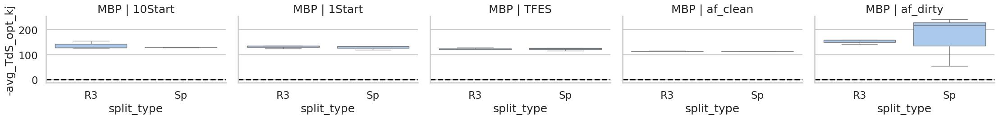

In [154]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
_dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]

# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.5, sharey='row', sharex='row', row_order=["MBP"])#, col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.boxplot, x="split_type", y="-avg_TdS_opt_kj", hue="protein", palette="pastel")#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("-avg_TdS_opt_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

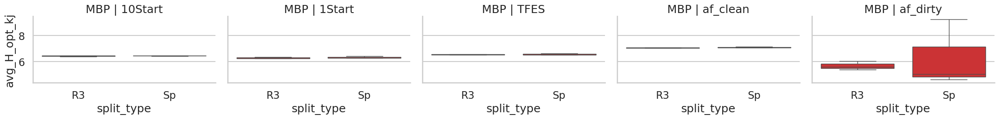

In [155]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]


# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.5, sharey='row', sharex='row', row_order=["MBP"])#, col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.boxplot, x="split_type", y="avg_H_opt_kj", hue="protein", palette="Set1")#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("avg_H_opt_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
# for ax in g.axes.flat:
#     ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

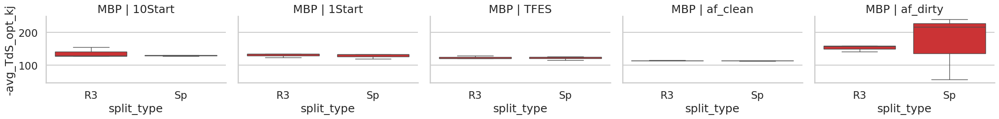

In [156]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]


# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.5, sharey='row', sharex='row', row_order=["MBP"])#, col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.boxplot, x="split_type", y="-avg_TdS_opt_kj", hue="protein", palette="Set1")#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("-avg_TdS_opt_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
# for ax in g.axes.flat:
#     ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

In [157]:
ensemble_pmf_df.protein.unique()

array(['MBP'], dtype=object)

  dataset                                      name  \
0    test  MBP_af_clean_RW_bench_s_naive_sequential   
1    test  MBP_af_clean_RW_bench_s_naive_sequential   
2    test  MBP_af_clean_RW_bench_s_naive_sequential   
3    test       MBP_af_clean_RW_bench_R3_k_sequence   
4    test       MBP_af_clean_RW_bench_R3_k_sequence   

                                     system  \
0  MBP_af_clean_RW_bench_s_naive_sequential   
1  MBP_af_clean_RW_bench_s_naive_sequential   
2  MBP_af_clean_RW_bench_s_naive_sequential   
3       MBP_af_clean_RW_bench_R3_k_sequence   
4       MBP_af_clean_RW_bench_R3_k_sequence   

                                  system_name            calc_name  \
0  MBP_af_clean_RW_bench_s_naive_sequential_1  test_MBP_af_clean_1   
1  MBP_af_clean_RW_bench_s_naive_sequential_2  test_MBP_af_clean_2   
2  MBP_af_clean_RW_bench_s_naive_sequential_3  test_MBP_af_clean_3   
3       MBP_af_clean_RW_bench_R3_k_sequence_1  test_MBP_af_clean_1   
4       MBP_af_clean_RW_bench_R3_k_s

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more

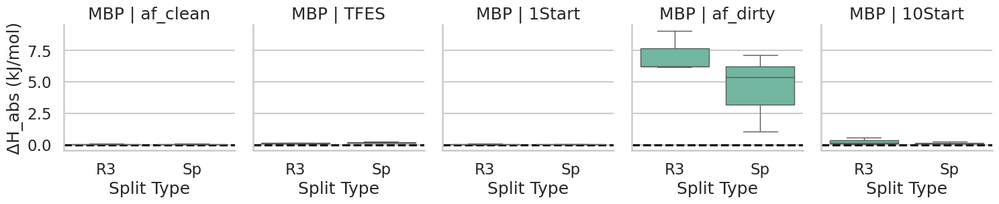

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

# Filter data for specific split types
_ensemble_pmf_df = ensemble_pmf_df[ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]

# Filter for dataset order
_ensemble_pmf_df = _ensemble_pmf_df[_ensemble_pmf_df["ensemble"].isin(_dataset_order)]

# Print data for verification
print(ensemble_pmf_df.head())

# Create color palette
palette = sns.color_palette("Set2", n_colors=len(_ensemble_pmf_df["split_type"].unique()))

# Create FacetGrid
g = sns.FacetGrid(
    _ensemble_pmf_df,
    row="protein",
    col="ensemble",
    height=3,
    aspect=1,
    sharey='row',
    sharex='row'
)

# Map boxplot
g.map_dataframe(
    sns.boxplot,
    x="split_type",
    y="delta_H_abs_kj",
    hue="ensemble",
    palette=palette,
    order=['R3', 'Sp']
)

# Customize plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_xlabels("Split Type")
g.set_ylabels("ΔH_abs (kJ/mol)")

# Add horizontal line at y=0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# Adjust layout
plt.subplots_adjust(top=0.95)

# Show plot
plt.show()

  dataset                                      name  \
0    test  MBP_af_clean_RW_bench_s_naive_sequential   
1    test  MBP_af_clean_RW_bench_s_naive_sequential   
2    test  MBP_af_clean_RW_bench_s_naive_sequential   
3    test       MBP_af_clean_RW_bench_R3_k_sequence   
4    test       MBP_af_clean_RW_bench_R3_k_sequence   

                                     system  \
0  MBP_af_clean_RW_bench_s_naive_sequential   
1  MBP_af_clean_RW_bench_s_naive_sequential   
2  MBP_af_clean_RW_bench_s_naive_sequential   
3       MBP_af_clean_RW_bench_R3_k_sequence   
4       MBP_af_clean_RW_bench_R3_k_sequence   

                                  system_name            calc_name  \
0  MBP_af_clean_RW_bench_s_naive_sequential_1  test_MBP_af_clean_1   
1  MBP_af_clean_RW_bench_s_naive_sequential_2  test_MBP_af_clean_2   
2  MBP_af_clean_RW_bench_s_naive_sequential_3  test_MBP_af_clean_3   
3       MBP_af_clean_RW_bench_R3_k_sequence_1  test_MBP_af_clean_1   
4       MBP_af_clean_RW_bench_R3_k_s

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  func(*plot_args, **plot_kwargs)
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/seaborn/axisgrid.py:854: UserWarning: The palette list has more

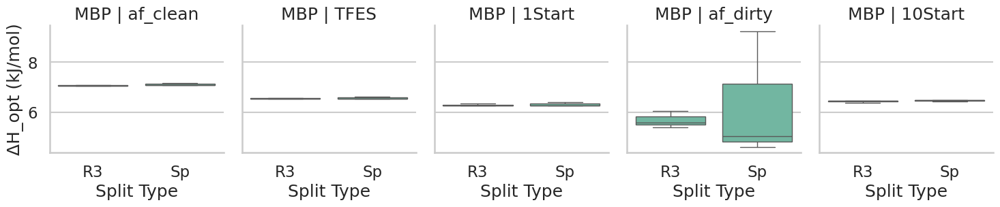

In [159]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data for specific split types
_ensemble_pmf_df = ensemble_pmf_df[ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]

# Filter for dataset order
_ensemble_pmf_df = _ensemble_pmf_df[_ensemble_pmf_df["ensemble"].isin(_dataset_order)]

# Print data for verification
print(ensemble_pmf_df.head())

# Create color palette
palette = sns.color_palette("Set2", n_colors=len(_ensemble_pmf_df["split_type"].unique()))

# Create FacetGrid
g = sns.FacetGrid(
    _ensemble_pmf_df,
    row="protein",
    col="ensemble",
    height=3,
    aspect=1,
    sharey='row',
    sharex='row'
)

# Map boxplot
g.map_dataframe(
    sns.boxplot,
    x="split_type",
    y="avg_H_opt_kj",
    hue="ensemble",
    palette=palette,
    order=['R3', 'Sp']
)

# Customize plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_xlabels("Split Type")
g.set_ylabels("ΔH_opt (kJ/mol)")

# Add horizontal line at y=0
# for ax in g.axes.flat:
#     ax.axhline(y=0, color='black', linestyle='--')

# Adjust layout
plt.subplots_adjust(top=0.95)

# Show plot
plt.show()

In [ ]:
from typing import List, Tuple

def calc_additive_pmfs(pmf_df: pd.DataFrame,
                      ensemble_pmf_df: pd.DataFrame,
                      method_combinations: List[List[str]] = [
                          ["BV-Only", "bvRW"],
                          ["RW-Only", "rwBV"]
                      ],
                      output_names: List[str] = ["BV+RW", "RW+BV"],
                      R=8.31, T=300
                      ) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Using the precomputed values from calc_pmf, calculate additive thermodynamic quantities
    by using the prior from the first method and computing deltas to the second method.
    
    Groups data by metadata keys (protein, ensemble, replicate, etc.) before computing combinations.
    """
    assert len(method_combinations) == len(output_names), "Method combinations and output names must have the same length"
    
    # Create copies to avoid modifying originals
    pmf_df = pmf_df.copy()
    ensemble_pmf_df = ensemble_pmf_df.copy()
    
    # Define grouping keys
    group_keys = ['protein', 'ensemble', 'replicate', 'bench_replicate', 'fit']
    
    # Get unique combinations of grouping keys
    grouped_data = pmf_df.groupby(group_keys)
    
    for group_values, group_df in grouped_data:
        group_dict = dict(zip(group_keys, group_values))
        
        for (prior_method, target_method), output_name in zip(method_combinations, output_names):

# Inside the method combinations loop:


            # Get prior data from first method
            prior_data = group_df[
                (group_df.method == prior_method) & 
                (group_df.dataset == "prior")
            ].copy()
            
            # Get test data from second method
            test_data = group_df[
                (group_df.method == target_method) & 
                (group_df.dataset == "test")
            ].copy()
            prior_data = prior_data.reset_index(drop=True)
            test_data = test_data.reset_index(drop=True)
            if len(prior_data) == 0 or len(test_data) == 0:
                continue
                
            # Create new entries with combined method name
            new_entries = test_data.copy()
            new_entries['method'] = output_name
            
            # After creating new_entries:
            # Calculate base values first
            new_entries["log_delta_PFi"] = np.abs(test_data["LogPf"] - prior_data["LogPf"].iloc[0])
            new_entries["avg_logPF"] = test_data.groupby("calc_name")["LogPf"].transform("mean")
            new_entries["beta_star"] = test_data.groupby("calc_name")["LogPf"].transform("std")/(R*T)
            new_entries["N_quanta"] = new_entries["log_delta_PFi"] / new_entries["beta_star"]

            # Then calculate delta metrics using prior data
            new_entries["delta_beta_star"] = test_data["beta_star"] - prior_data["beta_star"].iloc[0]
            new_entries["delta_avg_logPF"] = np.abs(test_data["avg_logPF"] - prior_data["avg_logPF"].iloc[0])
            new_entries["delta_N_quanta"] = test_data["N_quanta"] - prior_data["N_quanta"].iloc[0]
            # Update enthalpies
            new_entries["H_opt"] = R * T * new_entries["log_delta_PFi"].abs()
            new_entries["H_conf"] = R * T * new_entries["beta_star"] * np.abs(new_entries["delta_N_quanta"])
            new_entries["H_interaction"] = R * T * np.abs(new_entries["delta_beta_star"]) * new_entries["N_quanta"]
            
            # Update partition function and probabilities
            new_entries["Pi_opt"] = new_entries["Z_opt"] * np.exp(-new_entries["H_opt"].abs() / (R * T))
            new_entries["Pi_conf"] = new_entries["Z_opt"] * np.exp(-new_entries["H_conf"] / (R * T))
            
            # Update entropy terms
            new_entries["S_opt"] = -R * new_entries["Pi_opt"] * np.log(new_entries["Pi_opt"])
            new_entries["S_conf"] = -R * new_entries["Pi_conf"] * np.log(new_entries["Pi_conf"])
            
            # Update Gibbs free energy terms
            new_entries["G_opt"] = new_entries["H_opt"] - T * new_entries["S_opt"]
            new_entries["G_conf"] = new_entries["H_conf"] - T * new_entries["S_conf"]
            new_entries["G_quasi"] = (R*T * new_entries.groupby("calc_name")["delta_avg_logPF"].transform("mean")) - T * new_entries["S_opt"]
            
            # Convert to kJ/mol
            for metric in ["H_opt", "H_conf", "H_interaction", "S_opt", "S_conf", "G_opt", "G_conf"]:
                new_entries[f"{metric}_kj"] = new_entries[metric] / 1000
            
            new_entries["TdS_opt_kj"] = T * new_entries["S_opt"] / 1000
            new_entries["TdS_conf_kj"] = T * new_entries["S_conf"] / 1000
            
            # Add new entries to pmf_df
            pmf_df = pd.concat([pmf_df, new_entries], ignore_index=True)
            
            # Calculate ensemble metrics
            ensemble_metrics = {
                'dataset': 'test',
                'method': output_name,
                'system': test_data['system'].iloc[0],
                'system_name': test_data['system_name'].iloc[0],
                'calc_name': test_data['calc_name'].iloc[0],
                'protein': group_dict['protein'],
                'fit': group_dict['fit'],
                'ensemble': group_dict['ensemble'],
                'split_type': test_data['split_type'].iloc[0],
                'replicate': group_dict['replicate'],
                'bench_replicate': group_dict['bench_replicate'],
                'analysis': test_data['analysis'].iloc[0],
                'name': test_data['name'].iloc[0],
                
                # Delta metrics
                'delta_H_opt': (test_data['H_opt'] - prior_data['H_opt']).abs().mean(),
                'delta_H_opt_kj': (test_data['H_opt'] - prior_data['H_opt']).abs().mean() / 1000,
                'delta_S_opt': (test_data['S_opt'] - prior_data['S_opt']).abs().mean(),
                'delta_S_opt_kj': (test_data['S_opt'] - prior_data['S_opt']).abs().mean() / 1000,
                'Tdelta_S_opt': T * (test_data['S_opt'] - prior_data['S_opt']).abs().mean(),
                'Tdelta_S_opt_kj': T * (test_data['S_opt'] - prior_data['S_opt']).abs().mean() / 1000,
                '-Tdelta_S_opt_kj': T * (-test_data['S_opt'] - -prior_data['S_opt']).abs().mean() / 1000,
                'delta_G_opt': (test_data['G_opt'] - prior_data['G_opt']).abs().mean(),
                'delta_G_opt_kj': (test_data['G_opt'] - prior_data['G_opt']).abs().mean() / 1000,
                'delta_G_conf': (test_data['G_conf'] - prior_data['G_conf']).abs().mean(),
                'delta_G_conf_kj': (test_data['G_conf'] - prior_data['G_conf']).abs().mean() / 1000,
                'delta_G_quasi': (test_data['G_quasi'] - prior_data['G_quasi']).abs().mean(),
                'delta_G_quasi_kj': (test_data['G_quasi'] - prior_data['G_quasi']).abs().mean() / 1000,
                
                # Additional metrics
                'K_abs': np.exp(test_data['log_delta_PFi'].abs().mean()),
                'Q_abs': np.exp(test_data['delta_beta_star'].abs().mean()),
                'Z_opt': test_data['Z_opt'].mean(),
                
                # Average metrics
                'avg_beta_star': test_data['beta_star'].mean(),
                'avg_delta_avg_logPF': test_data['delta_avg_logPF'].mean(),
                'delta_PFi': test_data['log_delta_PFi'].mean(),
                'delta_H_abs': R*T*test_data['delta_avg_logPF'].mean(),
                'delta_H_abs_kj': R*T*test_data['delta_avg_logPF'].mean()/1000,
            }
                        
            print(f"Prior method: {prior_method}, Target method: {target_method}")
            print(f"Prior data shape: {prior_data.shape}")
            print(f"Test data shape: {test_data.shape}")
            print(f"First few columns of prior data:")
            print(prior_data[['method', 'dataset', 'protein', 'ensemble']].head())
            print(f"First few columns of test data:")
            print(test_data[['method', 'dataset', 'protein', 'ensemble']].head())

            # Before calculating metrics:
            print(f"Sample values from test data:")
            print(f"H_opt: {test_data['H_opt'].head()}")
            print(f"beta_star: {test_data['beta_star'].head()}")

            # Calculate likelihoods
            ensemble_metrics['likelihood_opt'] = np.exp(-ensemble_metrics['delta_G_opt'] / (R * T))
            ensemble_metrics['likelihood_conf'] = np.exp(-ensemble_metrics['delta_G_conf'] / (R * T))
            ensemble_metrics['quasi_likelihood'] = np.exp(-ensemble_metrics['delta_G_quasi'] / (R * T))
            
            # Add ensemble metrics to ensemble_pmf_df
            ensemble_pmf_df = pd.concat([ensemble_pmf_df, pd.DataFrame([ensemble_metrics])], ignore_index=True)
    
    return pmf_df, ensemble_pmf_df

pmf_df, ensemble_pmf_df = calc_additive_pmfs(pmf_df, ensemble_pmf_df)

Prior method: BV-Only, Target method: bvRW
Prior data shape: (72, 48)
Test data shape: (72, 48)
First few columns of prior data:
    method dataset protein  ensemble
0  BV-Only   prior    BPTI  af_clean
1  BV-Only   prior    BPTI  af_clean
2  BV-Only   prior    BPTI  af_clean
3  BV-Only   prior    BPTI  af_clean
4  BV-Only   prior    BPTI  af_clean
First few columns of test data:
  method dataset protein  ensemble
0   bvRW    test    BPTI  af_clean
1   bvRW    test    BPTI  af_clean
2   bvRW    test    BPTI  af_clean
3   bvRW    test    BPTI  af_clean
4   bvRW    test    BPTI  af_clean
Sample values from test data:
H_opt: 0     4003.164115
1     2503.767944
2     5745.551487
3    17215.977383
4    18031.654740
Name: H_opt, dtype: float64
beta_star: 0    0.001952
1    0.001952
2    0.001952
3    0.001952
4    0.001952
Name: beta_star, dtype: float64
Prior method: RW-Only, Target method: rwBV
Prior data shape: (72, 48)
Test data shape: (72, 48)
First few columns of prior data:
    method

Prior method: BV-Only, Target method: bvRW
Prior data shape: (72, 48)
Test data shape: (72, 48)
First few columns of prior data:
    method dataset protein  ensemble
0  BV-Only   prior    BPTI  af_clean
1  BV-Only   prior    BPTI  af_clean
2  BV-Only   prior    BPTI  af_clean
3  BV-Only   prior    BPTI  af_clean
4  BV-Only   prior    BPTI  af_clean
First few columns of test data:
  method dataset protein  ensemble
0   bvRW    test    BPTI  af_clean
1   bvRW    test    BPTI  af_clean
2   bvRW    test    BPTI  af_clean
3   bvRW    test    BPTI  af_clean
4   bvRW    test    BPTI  af_clean
Sample values from test data:
H_opt: 0     1863.771936
1      662.581119
2     6427.780145
3    11763.145462
4    12693.036282
Name: H_opt, dtype: float64
beta_star: 0    0.00148
1    0.00148
2    0.00148
3    0.00148
4    0.00148
Name: beta_star, dtype: float64
Prior method: RW-Only, Target method: rwBV
Prior data shape: (72, 48)
Test data shape: (72, 48)
First few columns of prior data:
    method data

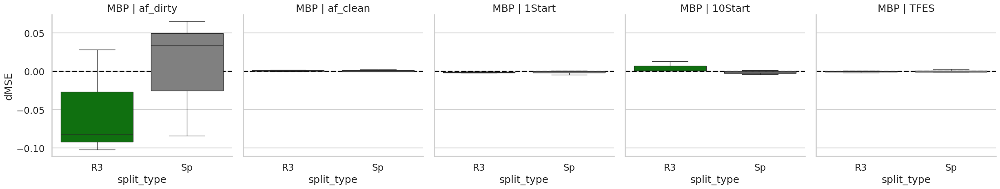

In [199]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
_dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]

# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
# Map the boxplot to the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=5, aspect=1, sharey='row', sharex='row', row_order=["MBP"], col_order=_dataset_order)
g.map_dataframe(sns.boxplot, x="split_type", y="dMSE", hue="split_type", palette={"R3": "green", "Sp": "grey"})
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("dMSE")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

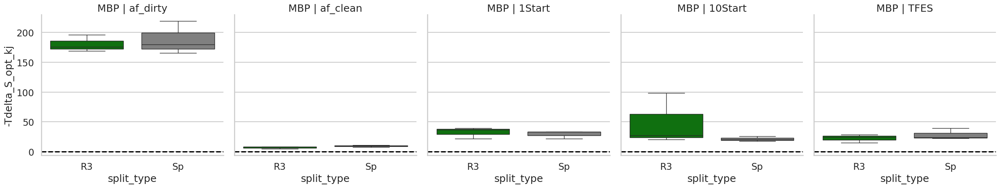

In [200]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
_dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]

# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
# Map the boxplot to the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=5, aspect=1, sharey='row', sharex='row', row_order=["MBP"], col_order=_dataset_order)
g.map_dataframe(sns.boxplot, x="split_type", y="-Tdelta_S_opt_kj", hue="split_type", palette={"R3": "green", "Sp": "grey"})
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("-Tdelta_S_opt_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

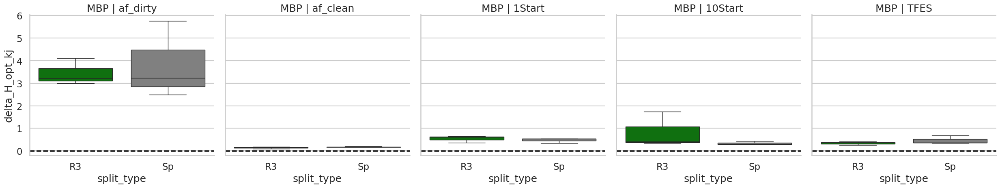

In [201]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
_dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]

# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
# Map the boxplot to the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=5, aspect=1, sharey='row', sharex='row', row_order=["MBP"], col_order=_dataset_order)
g.map_dataframe(sns.boxplot, x="split_type", y="delta_H_opt_kj", hue="split_type", palette={"R3": "green", "Sp": "grey"})
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("delta_H_opt_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

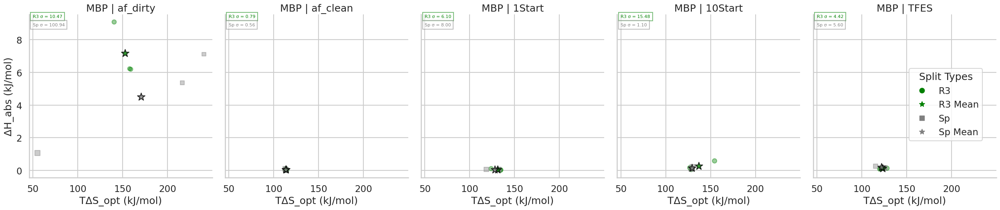

In [160]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set up the data
# Filter data for specific split types
_ensemble_pmf_df = ensemble_pmf_df[ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

# Filter for dataset order
_ensemble_pmf_df = _ensemble_pmf_df[_ensemble_pmf_df["ensemble"].isin(_dataset_order)]

# Force the order of the datasets
_ensemble_pmf_df["ensemble"] = pd.Categorical(_ensemble_pmf_df["ensemble"], categories=_dataset_order, ordered=True)

# Define consistent styles for split types
split_styles = {
    'R3': {'marker': 'o', 'color': 'Green'},  # Orange
    'Sp': {'marker': 's', 'color': 'Grey'}   # Blue
}

# Create the FacetGrid
g = sns.FacetGrid(_ensemble_pmf_df, 
                  row="protein", 
                  col="ensemble", 
                  height=5, 
                  aspect=1, 
                  sharey='row', 
                  sharex='row')

# Custom scatter plot function with consistent styling
def custom_scatter(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        ax.scatter(subset["-avg_TdS_opt_kj"], 
                  subset["delta_H_abs_kj"],
                  marker=style['marker'],
                  color=style['color'],
                  s=subset["avg_H_opt_kj"]*10,
                  label=split_type,
                  alpha=0.4)

# Function to calculate and annotate mean, median, and std dev with consistent styling
def annotate_statistics(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        if len(subset) > 0:
            # Calculate statistics
            mean_x = subset["-avg_TdS_opt_kj"].mean()
            mean_y = subset["delta_H_abs_kj"].mean()
            median_x = subset["-avg_TdS_opt_kj"].median()
            median_y = subset["delta_H_abs_kj"].median()
            
            # Calculate multivariate standard deviation
            X = np.vstack([subset["-avg_TdS_opt_kj"], subset["delta_H_abs_kj"]]).T
            cov_matrix = np.cov(X.T)
            mult_std = np.sqrt(np.trace(cov_matrix))
            
            # Plot mean with darker version of split type color
            ax.scatter(mean_x, mean_y, 
                      marker='*', 
                      s=200,
                      color=style['color'], 
                      edgecolor='black',
                      label=f'{split_type} Mean',
                      alpha=0.8,
                      zorder=5)
            
            # # Plot median with lighter version of split type color
            # ax.scatter(median_x, median_y, 
            #           marker='D', 
            #           s=100,
            #           color=style['color'], 
            #           edgecolor='black',
            #           alpha=1,
            #           label=f'{split_type} Median',
            #           zorder=5)
            
            # Add std dev annotation in the corner
            ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
                       xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
                       xycoords='axes fraction',
                       fontsize=8,
                       color=style['color'],
                       bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# Apply the plotting functions
g.map_dataframe(custom_scatter)
g.map_dataframe(annotate_statistics)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")
# g.set(yscale="log")

# Add axis labels
g.set_axis_labels("TΔS_opt (kJ/mol)", "ΔH_abs (kJ/mol)")

# Adjust layout
plt.subplots_adjust(top=0.95)

# Add a custom legend
handles = []
labels = []
for split_type, style in split_styles.items():
    # Add scatter plot points
    handles.append(plt.Line2D([0], [0], 
                            marker=style['marker'],
                            color=style['color'],
                            linestyle='None',
                            label=split_type))
    # Add mean markers
    handles.append(plt.Line2D([0], [0], 
                            marker='*',
                            color=style['color'],
                            # markeredgecolor='black',
                            linestyle='None',
                            markersize=10,
                            label=f'{split_type} Mean'))
    # # Add median markers
    # handles.append(plt.Line2D([0], [0], 
    #                         marker='D',
    #                         color=style['color'],
    #                         markeredgecolor='black',
    #                         linestyle='None',
    #                         alpha=0.7,
    #                         markersize=8,
    #                         label=f'{split_type} Median'))
    labels.extend([split_type, f'{split_type} Mean'])

g.fig.legend(handles, labels, 
            loc='center right', 
            bbox_to_anchor=(0.98, 0.5),
            title="Split Types")

plt.show()

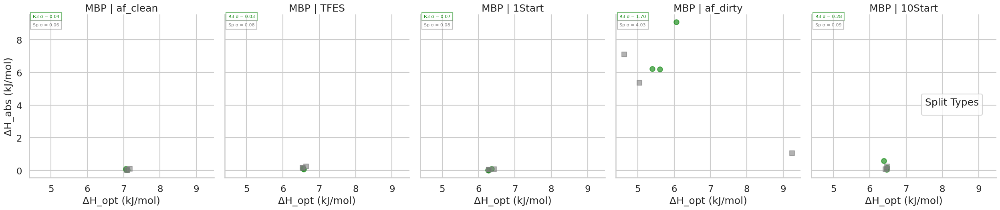

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set up the data
# Filter data for specific split types
_ensemble_pmf_df = ensemble_pmf_df[ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

# Filter for dataset order
_ensemble_pmf_df = _ensemble_pmf_df[_ensemble_pmf_df["ensemble"].isin(_dataset_order)]

# Define consistent styles for split types
split_styles = {
    'R3': {'marker': 'o', 'color': 'Green'},  # Orange
    'Sp': {'marker': 's', 'color': 'Grey'}   # Blue
}

# Create the FacetGrid
g = sns.FacetGrid(_ensemble_pmf_df, 
                  row="protein", 
                  col="ensemble", 
                  height=5, 
                  aspect=1, 
                  sharey='row', 
                  sharex='row')

# Custom scatter plot function with consistent styling
def custom_scatter(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        ax.scatter(subset["avg_H_opt_kj"], 
                  subset["delta_H_abs_kj"],
                  marker=style['marker'],
                  color=style['color'],
                #   s=subset["avg_H_opt_kj"]*10,
                  label=split_type,
                  alpha=0.6)

# Function to calculate and annotate mean, median, and std dev with consistent styling
def annotate_statistics(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        if len(subset) > 0:
            # Calculate statistics
            mean_x = subset["avg_H_opt_kj"].mean()
            mean_y = subset["delta_H_abs_kj"].mean()
            median_x = subset["avg_H_opt_kj"].median()
            median_y = subset["delta_H_abs_kj"].median()
            
            # Calculate multivariate standard deviation
            X = np.vstack([subset["avg_H_opt_kj"], subset["delta_H_abs_kj"]]).T
            cov_matrix = np.cov(X.T)
            mult_std = np.sqrt(np.trace(cov_matrix))
            
            # Plot mean with darker version of split type color
            # ax.scatter(mean_x, mean_y, 
            #           marker='*', 
            #           s=200,
            #           color=style['color'], 
            #           edgecolor='black',
            #           label=f'{split_type} Mean',
            #           zorder=5)
            
            # # Plot median with lighter version of split type color
            # ax.scatter(median_x, median_y, 
            #           marker='D', 
            #           s=100,
            #           color=style['color'], 
            #           edgecolor='black',
            #           alpha=1,
            #           label=f'{split_type} Median',
            #           zorder=5)
            
            # Add std dev annotation in the corner
            ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
                       xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
                       xycoords='axes fraction',
                       fontsize=8,
                       color=style['color'],
                       bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# Apply the plotting functions
g.map_dataframe(custom_scatter)
g.map_dataframe(annotate_statistics)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")
# g.set(yscale="log")

# Add axis labels
g.set_axis_labels("ΔH_opt (kJ/mol)", "ΔH_abs (kJ/mol)")

# Adjust layout
plt.subplots_adjust(top=0.95)

# Add a custom legend
handles = []
labels = []
for split_type, style in split_styles.items():
    # Add scatter plot points
    handles.append(plt.Line2D([0], [0], 
                            marker=style['marker'],
                            color=style['color'],
                            linestyle='None',
                            label=split_type))
    # Add mean markers
    # handles.append(plt.Line2D([0], [0], 
    #                         marker='*',
    #                         color=style['color'],
    #                         markeredgecolor='black',
    #                         linestyle='None',
    #                         markersize=10,
    #                         label=f'{split_type} Mean'))
    # # Add median markers
    # handles.append(plt.Line2D([0], [0], 
    #                         marker='D',
    #                         color=style['color'],
    #                         markeredgecolor='black',
    #                         linestyle='None',
    #                         alpha=0.7,
    #                         markersize=8,
    #                         label=f'{split_type} Median'))
    # labels.extend([split_type, f'{split_type} Mean', f'{split_type} Median'])

g.fig.legend(handles, labels, 
            loc='center right', 
            bbox_to_anchor=(0.98, 0.5),
            title="Split Types")

plt.show()

In [162]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np

# # Set up the data
# # Filter data for specific split types
# _ensemble_pmf_df = ensemble_pmf_df[ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# # Filter for dataset order
# _ensemble_pmf_df = _ensemble_pmf_df[_ensemble_pmf_df["ensemble"].isin(_dataset_order)]

# # Define consistent styles for split types
# split_styles = {
#     'R3': {'marker': 'o', 'color': 'Green'},  # Orange
#     'Sp': {'marker': 's', 'color': 'Grey'}   # Blue
# }

# # Create the FacetGrid
# g = sns.FacetGrid(_ensemble_pmf_df, 
#                   row="protein", 
#                   col="ensemble", 
#                   height=5, 
#                   aspect=1, 
#                   sharey='row', 
#                   sharex='row')

# # Custom scatter plot function with consistent styling
# def custom_scatter(data, **kwargs):
#     ax = plt.gca()
#     for split_type, style in split_styles.items():
#         subset = data[data["split_type"] == split_type]
#         ax.scatter(subset["-avg_TdS_opt_kj"], 
#                   subset["avg_H_opt_kj"],
#                   marker=style['marker'],
#                   color=style['color'],
#                   s=subset["delta_H_abs"],
#                   label=split_type,
#                   alpha=0.6)

# # Function to calculate and annotate mean, median, and std dev with consistent styling
# def annotate_statistics(data, **kwargs):
#     ax = plt.gca()
#     for split_type, style in split_styles.items():
#         subset = data[data["split_type"] == split_type]
#         if len(subset) > 0:
#             # Calculate statistics
#             mean_x = subset["-avg_TdS_opt_kj"].mean()
#             mean_y = subset["avg_H_opt_kj"].mean()
#             median_x = subset["-avg_TdS_opt_kj"].median()
#             median_y = subset["avg_H_opt_kj"].median()
            
#             # Calculate multivariate standard deviation
#             X = np.vstack([subset["-avg_TdS_opt_kj"], subset["avg_H_opt_kj"]]).T
#             cov_matrix = np.cov(X.T)
#             mult_std = np.sqrt(np.trace(cov_matrix))
            
#             # Plot mean with darker version of split type color
#             # ax.scatter(mean_x, mean_y, 
#             #           marker='*', 
#             #           s=200,
#             #           color=style['color'], 
#             #           edgecolor='black',
#             #           label=f'{split_type} Mean',
#             #           zorder=5)
            
#             # # Plot median with lighter version of split type color
#             # ax.scatter(median_x, median_y, 
#             #           marker='D', 
#             #           s=100,
#             #           color=style['color'], 
#             #           edgecolor='black',
#             #           alpha=1,
#             #           label=f'{split_type} Median',
#             #           zorder=5)
            
#             # Add std dev annotation in the corner
#             ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
#                        xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
#                        xycoords='axes fraction',
#                        fontsize=8,
#                        color=style['color'],
#                        bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# # Apply the plotting functions
# g.map_dataframe(custom_scatter)
# g.map_dataframe(annotate_statistics)

# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}")
# # g.set(yscale="log")

# # Add axis labels
# g.set_axis_labels("TΔS_opt (kJ/mol)", "ΔH_opt (kJ/mol)")

# # Adjust layout
# plt.subplots_adjust(top=0.95)

# # Add a custom legend
# handles = []
# labels = []
# for split_type, style in split_styles.items():
#     # Add scatter plot points
#     handles.append(plt.Line2D([0], [0], 
#                             marker=style['marker'],
#                             color=style['color'],
#                             linestyle='None',
#                             label=split_type))
#     # Add mean markers
#     # handles.append(plt.Line2D([0], [0], 
#     #                         marker='*',
#     #                         color=style['color'],
#     #                         markeredgecolor='black',
#     #                         linestyle='None',
#     #                         markersize=10,
#     #                         label=f'{split_type} Mean'))
#     # # Add median markers
#     # handles.append(plt.Line2D([0], [0], 
#     #                         marker='D',
#     #                         color=style['color'],
#     #                         markeredgecolor='black',
#     #                         linestyle='None',
#     #                         alpha=0.7,
#     #                         markersize=8,
#     #                         label=f'{split_type} Median'))
#     # labels.extend([split_type, f'{split_type} Mean', f'{split_type} Median'])

# g.fig.legend(handles, labels, 
#             loc='center right', 
#             bbox_to_anchor=(0.98, 0.5),
#             title="Split Types")

# plt.show()

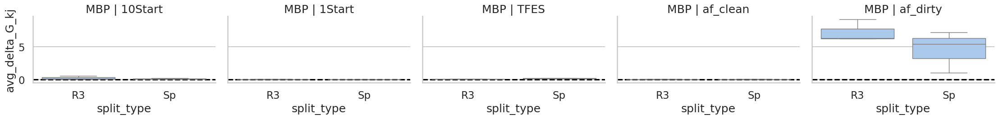

In [163]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
# sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["MD_Bad", "af_clean"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin([ "R3", "Sp"])]


# include only the _dataset_order
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.5, sharey='row', sharex='row', row_order=["MBP"])#, col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.boxplot, x="split_type", y="delta_H_abs_kj", hue="protein", palette="pastel")#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
g.set_ylabels("avg_delta_G_kj")#, fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
# g.tight_layout()
# Add legend
# g.set(yscale="log")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# g.add_legend(title="split type")#, fontsize=12)
# Show the plot
# g.set(ylim=(-3, 0))
plt.show()

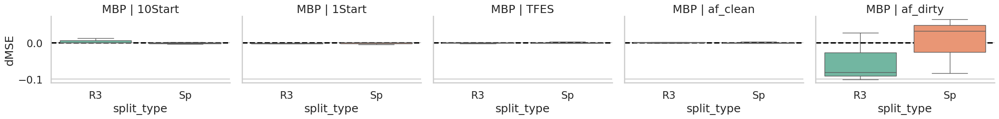

In [164]:
import seaborn as sns

import matplotlib.pyplot as plt

# Set context and style
sns.set_style("whitegrid")

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.5, sharey='row', sharex='row', row_order=["MBP"])

# Map the boxplot to the FacetGrid
g.map_dataframe(sns.boxplot, x="split_type", y="dMSE", hue="split_type", palette="Set2")

# Add a line at y = 0
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_ylabels("dMSE")

# Show the plot
plt.show()


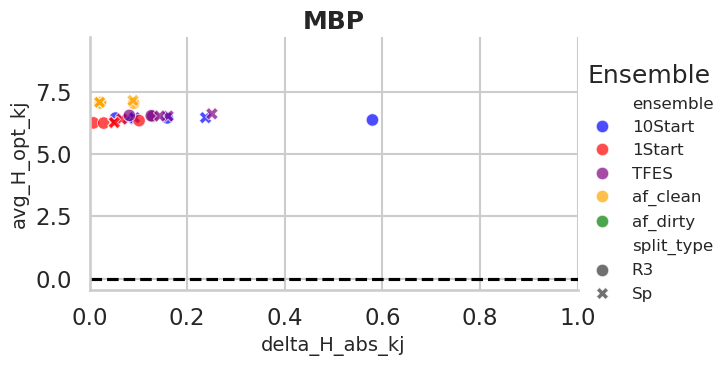

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")

# Define the custom palette and order
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dataset_colours = {
    "af_dirty": "green",
    "af_clean": "orange",
    "MD_Good": "red",
    "MD_Bad": "blue",
    "MD_Good+Bad": "purple",
    "1Start": "red",
    "10Start": "blue",
    "TFES": "purple"


}

# Filter the dataframe
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(
    _dMSE_energy_df, 
    row="protein",
    height=4, 
    aspect=1.5, 
    sharey=False, 
    sharex=False, 
    row_order=["MBP"]
)

# Map the scatterplot to the FacetGrid
g.map_dataframe(
    sns.scatterplot, 
    x="delta_H_abs_kj", 
    y="avg_H_opt_kj", 
    hue="ensemble", 
    palette=_dataset_colours, 
    style="split_type",
    alpha=0.7
)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("delta_H_abs_kj", fontsize=14)
g.set_ylabels("avg_H_opt_kj", fontsize=14)

# Adjust subplot spacing
g.tight_layout()
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# Add legend
# g.set(xscale="log")
g.set(xlim=(0,1))
g.add_legend(title="Ensemble", fontsize=12)

# Show the plot
plt.show()


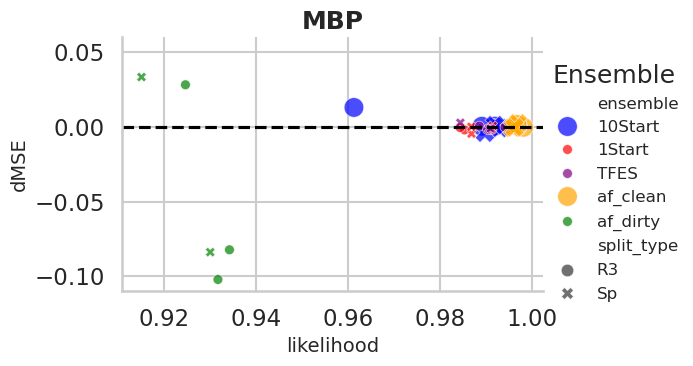

In [166]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")

# Define the custom palette and order
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dataset_colours = {
    "af_dirty": "green",
    "af_clean": "orange",
    "MD_Good": "red",
    "MD_Bad": "blue",
    "MD_Good+Bad": "purple",
    "1Start": "red",
    "10Start": "blue",
    "TFES": "purple"


}

# Define custom sizes for each dataset
_dataset_sizes = {
    "af_dirty": 50,
    "af_clean": 200,
    "MD_Good": 50,
    "MD_Bad": 200,
    "MD_Good+Bad": 50,
    "1Start": 50,
    "10Start": 200,
    "TFES": 50
}

# Filter the dataframe
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(
    _dMSE_energy_df,
    row="protein",
    height=4,
    aspect=1.5,
    sharey=False,
    sharex=False,
    row_order=["MBP"]
)

# Map the scatterplot to the FacetGrid
g.map_dataframe(
    sns.scatterplot,
    x="quasi_likelihood",
    y="dMSE",
    hue="ensemble",
    palette=_dataset_colours,
    style="split_type",
    alpha=0.7,
    size="ensemble",  # Use 'ensemble' column for size
    sizes=_dataset_sizes  # Use custom sizes
)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("likelihood", fontsize=14)
g.set_ylabels("dMSE", fontsize=14)

# Adjust subplot spacing
g.tight_layout()
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# Add legend
# g.set(xlim=(0.4,1))
g.set(ylim=(-0.11, 0.06))
g.add_legend(title="Ensemble", fontsize=12)

# Show the plot
plt.show()

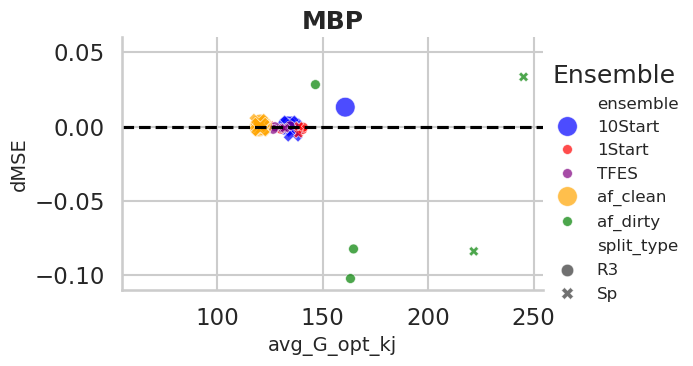

In [167]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")

# Define the custom palette and order
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]
_dataset_order = ["af_dirty", "af_clean", "1Start", "10Start", "TFES"]

_dataset_colours = {
    "af_dirty": "green",
    "af_clean": "orange",
    "MD_Good": "red",
    "MD_Bad": "blue",
    "MD_Good+Bad": "purple",
    "1Start": "red",
    "10Start": "blue",
    "TFES": "purple"


}
# Define custom sizes for each dataset
_dataset_sizes = {
    "af_dirty": 50,
    "af_clean": 200,
    "MD_Good": 50,
    "MD_Bad": 200,
    "MD_Good+Bad": 50,
    "1Start": 50,
    "10Start": 200,
    "TFES": 50
}
# Filter the dataframe
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(
    _dMSE_energy_df,
    row="protein",
    height=4,
    aspect=1.5,
    sharey=False,
    sharex=False,
    row_order=["MBP"]
)

# Map the scatterplot to the FacetGrid
g.map_dataframe(
    sns.scatterplot,
    x="avg_G_opt_kj",
    y="dMSE",
    hue="ensemble",
    palette=_dataset_colours,
    style="split_type",
    alpha=0.7,
    size="ensemble",  # Use 'ensemble' column for size
    sizes=_dataset_sizes  # Use custom sizes
)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("avg_G_opt_kj", fontsize=14)
g.set_ylabels("dMSE", fontsize=14)

# Adjust subplot spacing
g.tight_layout()
for ax in g.axes.flat:
    ax.axhline(y=0, color='black', linestyle='--')

# Add legend
# g.set(xlim=(0.9,1))
g.set(ylim=(-0.11, 0.06))
g.add_legend(title="Ensemble", fontsize=12)

# Show the plot
plt.show()

In [168]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np

# # Set up the data
# _dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Define consistent styles for split types
# split_styles = {
#     'R3': {'marker': 'o', 'color': 'Green'},
#     'Sp': {'marker': 's', 'color': 'Grey'}
# }

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, 
#                   row="protein", 
#                   col="ensemble", 
#                   height=5, 
#                   aspect=1, 
#                   sharey='row', 
#                   sharex='row')

# # Custom scatter plot function with consistent styling
# def custom_scatter(data, **kwargs):
#     ax = plt.gca()
#     ax.axhline(y=0, color='black', linestyle='--', linewidth=1)  # Add horizontal line at y=0
#     for split_type, style in split_styles.items():
#         subset = data[data["split_type"] == split_type]
#         ax.scatter(subset["-avg_TdS_opt_kj"], 
#                   subset["dMSE"],
#                   marker=style['marker'],
#                   color=style['color'],
#                   s=subset["delta_H_abs"],
#                   label=split_type,
#                   alpha=0.6)

# # Function to calculate and annotate mean, median, and std dev with consistent styling
# def annotate_statistics(data, **kwargs):
#     ax = plt.gca()
#     for split_type, style in split_styles.items():
#         subset = data[data["split_type"] == split_type]
#         if len(subset) > 0:
#             # Calculate statistics
#             mean_x = subset["-avg_TdS_opt_kj"].mean()
#             mean_y = subset["dMSE"].mean()
#             median_x = subset["-avg_TdS_opt_kj"].median()
#             median_y = subset["dMSE"].median()
            
#             # Calculate multivariate standard deviation
#             X = np.vstack([subset["-avg_TdS_opt_kj"], subset["dMSE"]]).T
#             cov_matrix = np.cov(X.T)
#             mult_std = np.sqrt(np.trace(cov_matrix))
            
#             # Add std dev annotation in the corner
#             ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
#                        xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
#                        xycoords='axes fraction',
#                        fontsize=8,
#                        color=style['color'],
#                        bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# # Apply the plotting functions
# g.map_dataframe(custom_scatter)
# g.map_dataframe(annotate_statistics)

# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}")

# # Add axis labels
# g.set_axis_labels("TΔS_opt (kJ/mol)", "dMSE")

# # Adjust layout
# plt.subplots_adjust(top=0.95)

# # Add a custom legend
# handles = []
# labels = []
# for split_type, style in split_styles.items():
#     # Add scatter plot points
#     handles.append(plt.Line2D([0], [0], 
#                             marker=style['marker'],
#                             color=style['color'],
#                             linestyle='None',
#                             label=split_type))

# g.fig.legend(handles, labels, 
#             loc='center right', 
#             bbox_to_anchor=(0.98, 0.5),
#             title="Split Types")

# plt.show()


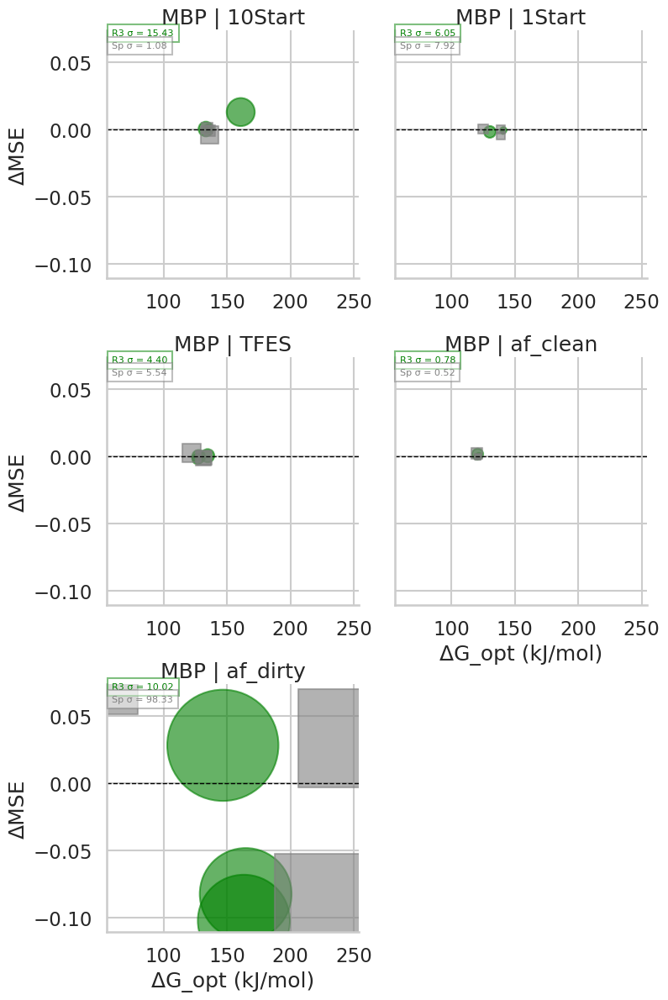

In [169]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set up the data
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]
# select MBP
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["protein"].isin(["MBP"])]
# Define consistent styles for split types
split_styles = {
    'R3': {'marker': 'o', 'color': 'Green'},
    'Sp': {'marker': 's', 'color': 'Grey'}
}

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, 
                #   row="protein", 
                  col="ensemble", 
                  col_wrap=2,
                  height=4, 
                  aspect=1, 
                  sharey='row', 
                  sharex='row')

# Custom scatter plot function with consistent styling
def custom_scatter(data, **kwargs):
    ax = plt.gca()
    ax.axhline(y=0, color='black', linestyle='--', linewidth=1)  # Add horizontal line at y=0
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        ax.scatter(subset["avg_G_opt_kj"], 
                  subset["dMSE"],
                  marker=style['marker'],
                  color=style['color'],
                  s=subset["delta_H_abs"],
                  label=split_type,
                  alpha=0.6)

# Function to calculate and annotate mean, median, and std dev with consistent styling
def annotate_statistics(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        if len(subset) > 0:
            # Calculate statistics
            mean_x = subset["avg_G_opt_kj"].mean()
            mean_y = subset["dMSE"].mean()
            median_x = subset["avg_G_opt_kj"].median()
            median_y = subset["dMSE"].median()
            
            # Calculate multivariate standard deviation
            X = np.vstack([subset["avg_G_opt_kj"], subset["dMSE"]]).T
            cov_matrix = np.cov(X.T)
            mult_std = np.sqrt(np.trace(cov_matrix))
            
            # Add std dev annotation in the corner
            ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
                       xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
                       xycoords='axes fraction',
                       fontsize=8,
                       color=style['color'],
                       bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# Apply the plotting functions
g.map_dataframe(custom_scatter)
g.map_dataframe(annotate_statistics)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="MBP | {col_name}")

# Add axis labels
g.set_axis_labels("ΔG_opt (kJ/mol)", "ΔMSE")

# Adjust layout
plt.subplots_adjust(top=0.95)

# Add a custom legend
handles = []
labels = []
for split_type, style in split_styles.items():
    # Add scatter plot points
    handles.append(plt.Line2D([0], [0], 
                            marker=style['marker'],
                            color=style['color'],
                            linestyle='None',
                            label=split_type))

# g.fig.legend(handles, labels, 
#             loc='center right', 
#             bbox_to_anchor=(0.98, 0.5),
#             # title="Split Types"
#             )

plt.show()


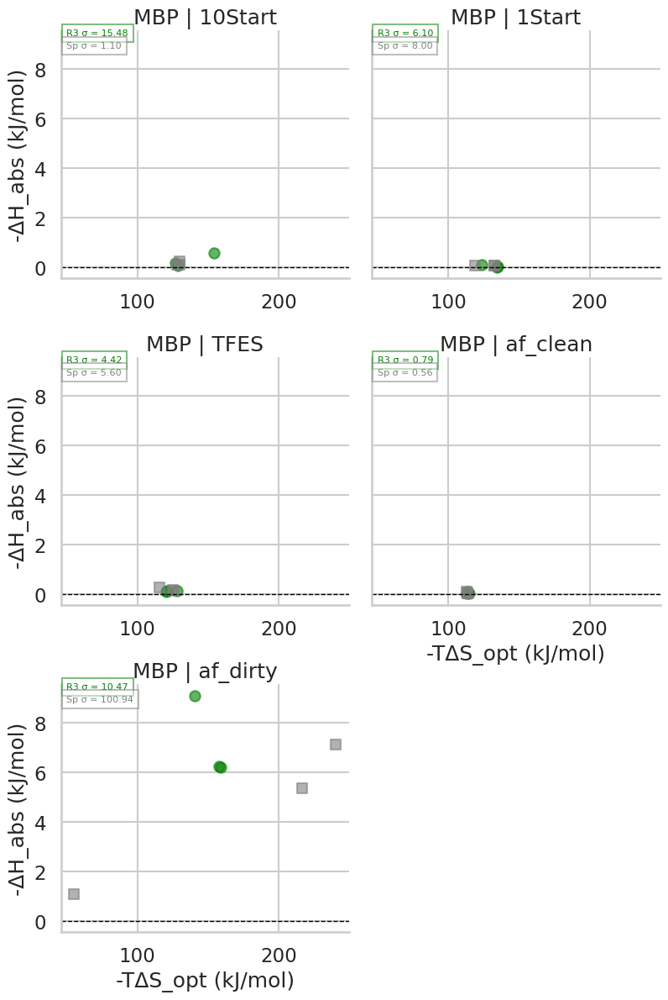

In [170]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set up the data
_dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]
# select MBP
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["protein"].isin(["MBP"])]
# Define consistent styles for split types
split_styles = {
    'R3': {'marker': 'o', 'color': 'Green'},
    'Sp': {'marker': 's', 'color': 'Grey'}
}

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, 
                #   row="protein", 
                  col="ensemble", 
                  col_wrap=2,
                  height=4, 
                  aspect=1, 
                  sharey='row', 
                  sharex='row')

# Custom scatter plot function with consistent styling
def custom_scatter(data, **kwargs):
    ax = plt.gca()
    ax.axhline(y=0, color='black', linestyle='--', linewidth=1)  # Add horizontal line at y=0
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        ax.scatter(subset["-avg_TdS_opt_kj"], 
                  subset["delta_H_abs_kj"],
                  marker=style['marker'],
                  color=style['color'],
                #   s=subset["delta_H_abs"],
                  label=split_type,
                  alpha=0.6)

# Function to calculate and annotate mean, median, and std dev with consistent styling
def annotate_statistics(data, **kwargs):
    ax = plt.gca()
    for split_type, style in split_styles.items():
        subset = data[data["split_type"] == split_type]
        if len(subset) > 0:
            # Calculate statistics
            mean_x = subset["-avg_TdS_opt_kj"].mean()
            mean_y = subset["delta_H_abs_kj"].mean()
            median_x = subset["-avg_TdS_opt_kj"].median()
            median_y = subset["delta_H_abs_kj"].median()
            
            # Calculate multivariate standard deviation
            X = np.vstack([subset["-avg_TdS_opt_kj"], subset["delta_H_abs_kj"]]).T
            cov_matrix = np.cov(X.T)
            mult_std = np.sqrt(np.trace(cov_matrix))
            
            # Add std dev annotation in the corner
            ax.annotate(f'{split_type} σ = {mult_std:.2f}', 
                       xy=(0.02, 0.98 - (0.05 * list(split_styles.keys()).index(split_type))),
                       xycoords='axes fraction',
                       fontsize=8,
                       color=style['color'],
                       bbox=dict(facecolor='white', edgecolor=style['color'], alpha=0.5))

# Apply the plotting functions
g.map_dataframe(custom_scatter)
g.map_dataframe(annotate_statistics)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="MBP | {col_name}")

# Add axis labels
g.set_axis_labels("-TΔS_opt (kJ/mol)", "-ΔH_abs (kJ/mol)")

# Adjust layout
plt.subplots_adjust(top=0.95)

# Add a custom legend
handles = []
labels = []
for split_type, style in split_styles.items():
    # Add scatter plot points
    handles.append(plt.Line2D([0], [0], 
                            marker=style['marker'],
                            color=style['color'],
                            linestyle='None',
                            label=split_type))

# g.fig.legend(handles, labels, 
#             loc='center right', 
#             bbox_to_anchor=(0.98, 0.5),
#             # title="Split Types"
#             )

plt.show()


In [171]:
ensemble_pmf_df.quasi_likelihood

0     0.997934
1     0.998340
2     0.998303
3     0.998108
4     0.996806
        ...   
91    0.985045
92    0.986185
93    0.989383
94    0.989293
95    0.991518
Name: quasi_likelihood, Length: 96, dtype: float64

In [172]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")

# # Define the custom palette and order
# _dataset_order = ["af_clean", "MD_Bad"]
# _dataset_colours = {
#     "af_dirty": "green",
#     "af_clean": "orange",
#     "MD_Good": "red",
#     "MD_Bad": "blue",
#     "MD_Good+Bad": "purple"
# }

# _dataset_point_size = {
#     "af_dirty": 2,
#     "af_clean": 10,
#     "MD_Good": 2,
#     "MD_Bad": 10,
#     "MD_Good+Bad": 2
# }

# # Filter the dataframe
# _dMSE_energy_df = dMSE_ensemble_pmf_df[dMSE_ensemble_pmf_df["split_type"].isin(["R3", "Sp"])]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(
#     _dMSE_energy_df, 
#     row="protein",
#     height=4, 
#     aspect=1.5, 
#     sharey=False, 
#     sharex=False, 
#     row_order=["MBP"]
# )

# # Map the scatterplot to the FacetGrid
# g.map_dataframe(
#     sns.scatterplot, 
#     x="likelihood", 
#     y="dMSE", 
#     hue="ensemble", 
#     palette=_dataset_colours, 
#     style="split_type",
#     alpha=0.7
# )

# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("likelihood", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)

# # Adjust subplot spacing
# g.tight_layout()
# for ax in g.axes.flat:
#     ax.axhline(y=0, color='black', linestyle='--')

# # Add legend
# # g.set(xscale="log")
# g.set(xlim=(0,1))
# g.add_legend(title="Ensemble", fontsize=12)

# # Show the plot
# plt.show()


In [173]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein", height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="Gfe**(dMSE)", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# # g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("Gfe**(dMSE)", fontsize=14)
# # # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(yscale="log")

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [174]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein", height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="dMSE/gibbs_free_energy", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# # g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("dMSE/gibbs_free_energy", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [175]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean"]

# _dMSE_energy_df = dMSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein", col="ensemble", height=3, aspect=1.2, sharey=True, sharex=True)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.boxplot, x="ensemble", y="JSD", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}")#, fontsize=16, fontweight="bold")
# # g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("JSD")#, fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")

# # g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [176]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad"]#, "af_conftop", "af_confbottom", "af_conf0.0", "af_conf0.1", "af_conf0.2", "af_conf0.3", "af_conf0.4", "af_conf0.5", "af_conf0.6", "af_conf0.7", "af_conf0.8", "af_conf0.9"]
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]


# # include only the _dataset_order
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",col="ensemble", height=5, aspect=1.5, sharey=True, sharex=True)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="energy_difference", y="dMSE", hue="split_type", palette="Set2")#, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [177]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# _MSE_energy_df=MSE_energy_df
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein", col="ensemble",height=5, aspect=1.5, sharey=True, sharex=True)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="mse", hue="split_type", palette="Set2", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

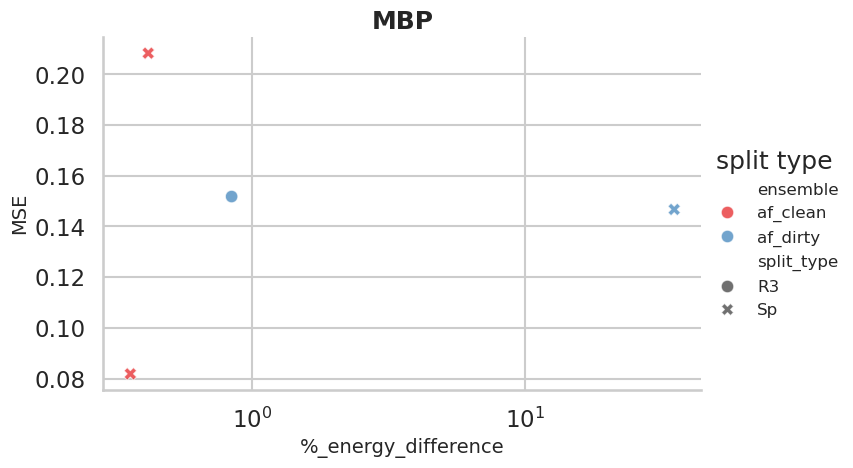

In [178]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

_MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# _MSE_energy_df=MSE_energy_df
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
_MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False, row_order=["MBP"])#, col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("%_energy_difference", fontsize=14)
g.set_ylabels("MSE", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
g.tight_layout()
# Add legend
g.set(xscale="log")
# g.set(xlim=(0, 100))
g.add_legend(title="split type", fontsize=12)
# Show the plot
plt.show()

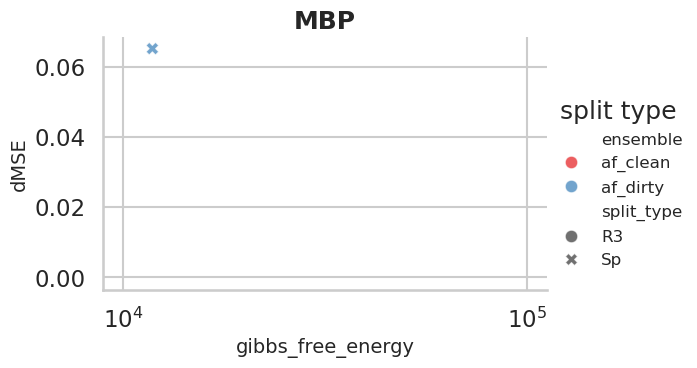

In [179]:



import seaborn as sns
import matplotlib.pyplot as plt
# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")
# # Create a custom palette
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

_dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# _MSE_energy_df=MSE_energy_df
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=4, aspect=1.5, sharey=False, sharex=False, row_order=["MBP"]) #col_order=split_order, sharex=True)
# Map the boxplot to the FacetGrid
g.map_dataframe(sns.scatterplot, x="gibbs_free_energy", y="dMSE", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
#, order=_dataset_order)
# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("gibbs_free_energy", fontsize=14)
g.set_ylabels("dMSE", fontsize=14)
# # Rotate x-tick labels
# for ax in g.axes.flat:
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # Adjust subplot spacing
g.tight_layout()
# Add legend
g.set(xscale="log")
# g.set(xlim=(0, 100))
g.add_legend(title="split type", fontsize=12)
# Show the plot
plt.show()

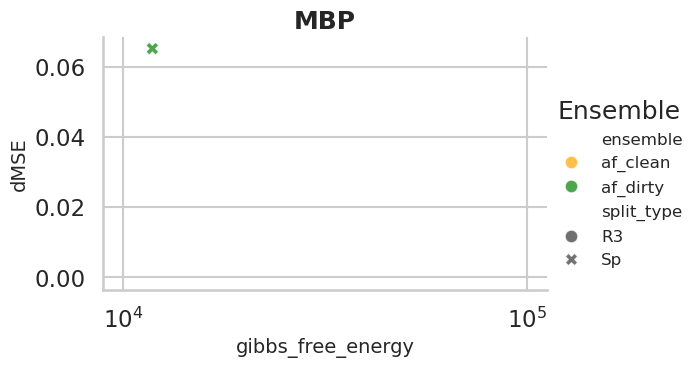

In [180]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set context and style
sns.set_context("talk")
sns.set_style("whitegrid")

# Define the custom palette and order
_dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]
_dataset_colours = {
    "af_dirty": "green",
    "af_clean": "orange",
    "MD_Good": "red",
    "MD_Bad": "blue",
    "MD_Good+Bad": "purple"
}

# Filter the dataframe
_dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin(["R3", "Sp"])]
_dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# Create the FacetGrid
g = sns.FacetGrid(
    _dMSE_energy_df, 
    row="protein",
    height=4, 
    aspect=1.5, 
    sharey=False, 
    sharex=False, 
    row_order=["MBP"]
)

# Map the scatterplot to the FacetGrid
g.map_dataframe(
    sns.scatterplot, 
    x="gibbs_free_energy", 
    y="dMSE", 
    hue="ensemble", 
    palette=_dataset_colours, 
    style="split_type",
    alpha=0.7
)

# Customize the plot
g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
g.set_xlabels("gibbs_free_energy", fontsize=14)
g.set_ylabels("dMSE", fontsize=14)

# Adjust subplot spacing
g.tight_layout()

# Add legend
g.set(xscale="log")
g.add_legend(title="Ensemble", fontsize=12)

# Show the plot
plt.show()


In [181]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False, row_order=["MBP"]) #col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="energy_difference", y="dMSE", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("delta H", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [182]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="KL_divergence", y="dMSE", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("KL", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [183]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="JS_divergence", y="entropy_difference", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("JSD", fontsize=14)
# g.set_ylabels("delta S", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [184]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="energy_difference", y="dMSE", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("ED", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [185]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _dMSE_energy_df = dMSE_energy_df[dMSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _dMSE_energy_df = _dMSE_energy_df[_dMSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_dMSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="JS_divergence", y="dMSE", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("JSD", fontsize=14)
# g.set_ylabels("dMSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# # g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [186]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="energy_difference", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [187]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="KL_divergence", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("KL_divergence", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(ylim=(0, 0.6))

# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [188]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_KL_divergence", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_KL_divergence", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(ylim=(0, 0.6))

# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [189]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="enthalpy_difference", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("enthalpy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(ylim=(0, 0.6))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [190]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette
# _dataset_order = ["af_dirty", "af_clean", "MD_Good", "MD_Bad", "MD_Good+Bad"]

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex=False)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="entropy_difference", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("Entropy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(ylim=(0, 0.6))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [191]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=True, sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="mse", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [192]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=False, sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="JS_divergence", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("JSD", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [193]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="energy_difference", y="KL_divergence", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("energy_difference", fontsize=14)
# g.set_ylabels("KL_divergence", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# g.set(yscale="log")

# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [194]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="%_KL_divergence", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("%_KL_divergence", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# g.set(yscale="log")

# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [195]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="JS_divergence", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("JS_divergence", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(yscale="log")

# # g.set(ylim=(0, 1))
# g.set(xlim=(0))

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [196]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# # _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey='row', sharex='row')#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="enthalpy", y="KL_divergence", hue="ensemble", palette="Set1", style="split_type",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("enthalpy", fontsize=14)
# g.set_ylabels("KL_divergence", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# g.set(yscale="log")

# g.set(ylim=(0, 1))
# g.set(xlim=(0))

# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()

In [197]:



# import seaborn as sns
# import matplotlib.pyplot as plt
# # Set context and style
# sns.set_context("talk")
# sns.set_style("whitegrid")
# # # Create a custom palette

# _MSE_energy_df = MSE_energy_df[MSE_energy_df["split_type"].isin([ "R3", "Sp"])]
# _MSE_energy_df=MSE_energy_df
# # _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"]!="Shaw_400"]
# _MSE_energy_df = _MSE_energy_df[_MSE_energy_df["ensemble"].isin(_dataset_order)]

# # Create the FacetGrid
# g = sns.FacetGrid(_MSE_energy_df, row="protein",height=5, aspect=1.5, sharey=True, sharex=True)#, row_order=protein_names, col_order=split_order, sharex=True)
# # Map the boxplot to the FacetGrid
# g.map_dataframe(sns.scatterplot, x="%_energy_difference", y="mse", hue="split_type", palette="Set2", style="ensemble",alpha=0.7)#, order=_dataset_order)
# #, order=_dataset_order)
# # Customize the plot
# g.set_titles(row_template="{row_name}", col_template="{col_name}", fontsize=16, fontweight="bold")
# g.set_xlabels("%_energy_difference", fontsize=14)
# g.set_ylabels("MSE", fontsize=14)
# # # Rotate x-tick labels
# # for ax in g.axes.flat:
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
# # # Adjust subplot spacing
# g.tight_layout()
# # Add legend
# g.set(xscale="log")
# # g.set(xlim=(0, 100))
# g.add_legend(title="split type", fontsize=12)
# # Show the plot
# plt.show()